In [1]:
import numpy as np
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cf
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
import matplotlib.path as mpath
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors
# import colorcet as cc
import copy, os
import colormaps as cmaps
import easygems.healpix as egh

In [ ]:
rootdir = '/pscratch/sd/w/wcmca1/hackathon/allmasks/stats/monthly/'
name_map = {
    'obs': 'IMERGv7',
    'm1': 'scream',
    'm2': 'icon_d3hp003',
    'm3': 'casesm2_10km_nocumulus',
}
name_map_plot = {
    'obs': 'OBS',
    'm1': 'SCREAM',
    'm2': 'ICON',
    'm3': 'CASESM2',
}

# Input fignames
fignames = {key:f'{rootdir}{value}_monthly_rainmap_by_featuretypes_hp8_v1.nc' for key,value in name_map.items()}

landmaskfile = '/global/cfs/cdirs/m4581/gsharing/hackathon/scream-cess-healpix/scream2D_hrly_topo_hp8_v7.zarr'

figdir = '/global/cfs/cdirs/m1867/zfeng/hk25/figures/'
os.makedirs(figdir, exist_ok=True)
print(figdir)

/global/cfs/cdirs/m1867/zfeng/hk25/figures/


### Check if input files exist

In [3]:
for key, value in filenames.items():
    print(f'{value}: {os.path.isfile(value)}')

/pscratch/sd/w/wcmca1/hackathon/allmasks/stats/monthly/IMERGv7_monthly_rainmap_by_featuretypes_hp8_v1.nc: True
/pscratch/sd/w/wcmca1/hackathon/allmasks/stats/monthly/scream_monthly_rainmap_by_featuretypes_hp8_v1.nc: True
/pscratch/sd/w/wcmca1/hackathon/allmasks/stats/monthly/icon_d3hp003_monthly_rainmap_by_featuretypes_hp8_v1.nc: True
/pscratch/sd/w/wcmca1/hackathon/allmasks/stats/monthly/casesm2_10km_nocumulus_monthly_rainmap_by_featuretypes_hp8_v1.nc: True


In [4]:
dstop = xr.open_dataset(landmaskfile)
ter = dstop.ELEV
landfrac = dstop.LANDFRAC
dstop

<xarray.Dataset> Size: 13MB
Dimensions:   (cell: 786432, crs: 0)
Coordinates:
  * crs       (crs) float64 0B 
Dimensions without coordinates: cell
Data variables:
    ELEV      (cell) float32 3MB ...
    LANDFRAC  (cell) float32 3MB ...
    lat       (cell) float32 3MB ...
    lon       (cell) float32 3MB ...
Attributes:
    NCO:                        netCDF Operators version 4.9.8-alpha01 (Homep...
    history:                    Fri Jun 11 12:26:48 2021: ncks -A USGS-gtopo3...
    history_of_appended_files:  Fri Jun 11 12:26:48 2021: Appended file USGS-...
    source:                     USGS 30-sec dataset binned to ncube3000 (cube...
    title:                      30-second USGS topo data

<Figure size 640x480 with 0 Axes>

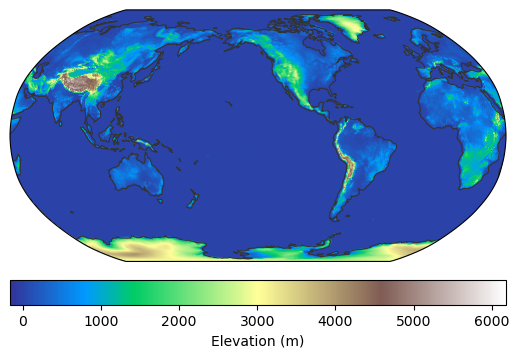

In [5]:
im = egh.healpix_show(ter, cmap='terrain')
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Elevation (m)')

<Figure size 640x480 with 0 Axes>

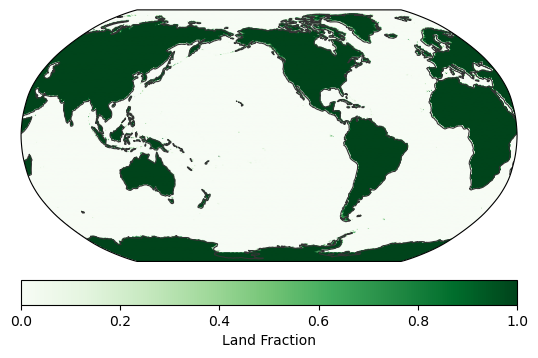

In [6]:
im = egh.healpix_show(landfrac, cmap='Greens', vmin=0, vmax=1)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='Land Fraction')

## Read and combine all sources to a single DataSet

In [7]:
drop_vars = []
# Read all files and combine them with a new dimension 'source'
ds = xr.open_mfdataset(list(filenames.values()), combine='nested', concat_dim='source', drop_variables=drop_vars).squeeze()
# Assign new coordinate 'source' using name_map dictionary keys
ds['source'] = list(name_map.keys())
# ds = ds.pipe(egh.attach_coords)
ds

<xarray.Dataset> Size: 3GB
Dimensions:                  (source: 4, time: 20, cell: 786432)
Coordinates:
  * time                     (time) datetime64[ns] 160B 2019-08-01 ... 2021-0...
  * cell                     (cell) int32 3MB 0 1 2 3 ... 786429 786430 786431
    lat                      (cell) float64 6MB dask.array<chunksize=(786432,), meta=np.ndarray>
    lon                      (cell) float64 6MB dask.array<chunksize=(786432,), meta=np.ndarray>
    crs                      int64 8B 0
  * source                   (source) <U3 48B 'obs' 'm1' 'm2' 'm3'
Data variables: (12/14)
    precipitation            (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    ntimes                   (source, time) float32 320B dask.array<chunksize=(1, 12), meta=np.ndarray>
    mcs_precipitation        (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    mcs_count                (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    mcs_precipitation_count  (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    ar_precipitation         (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    ...                       ...
    tc_precipitation         (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    tc_count                 (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    tc_precipitation_count   (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    etc_precipitation        (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    etc_count                (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
    etc_precipitation_count  (source, time, cell) float32 252MB dask.array<chunksize=(1, 1, 786432), meta=np.ndarray>
Attributes:
    Title:                    Monthly precipitation statistics by feature type
    contact:                  Zhe Feng, zhe.feng@pnnl.gov
    created_on:               Thu Aug  7 16:45:38 2025
    grid_type:                HEALPix
    zoom_level:               8
    time_interval:            6.0
    precipitation_threshold:  0.1

In [8]:
ds.ntimes.sum(dim='time').values

array([1588., 3137., 1460., 1459.], dtype=float32)

In [9]:
# Get time interval from attributes
time_interval = float(ds.attrs['time_interval'])

# Calculate total hours accounting for time interval
# ntimes is the number of timesteps, multiply by time_interval to get actual hours
ntimes = ds.ntimes.sum(dim='time')
nhours = ntimes * time_interval

# Sum monthly precipitation amount [mm], divided by total hours to get mm/day
totpcp_all = 24. * ds.precipitation.sum(dim='time') / nhours
mcspcp_all = 24. * ds.mcs_precipitation.sum(dim='time') / nhours
arpcp_all = 24. * ds.ar_precipitation.sum(dim='time') / nhours
tcpcp_all = 24. * ds.tc_precipitation.sum(dim='time') / nhours
etcpcp_all = 24. * ds.etc_precipitation.sum(dim='time') / nhours

# Calculate precipitation fractions
mcspcpfrac_all = 100. * mcspcp_all / totpcp_all
arpcpfrac_all = 100. * arpcp_all / totpcp_all
tcpcpfrac_all = 100. * tcpcp_all / totpcp_all
etcpcpfrac_all = 100. * etcpcp_all / totpcp_all

# Calculate number of feature hours - already in hours, no need to convert
mcscount_all = ds.mcs_count.sum(dim='time')
arcount_all = ds.ar_count.sum(dim='time')
tccount_all = ds.tc_count.sum(dim='time')
etcpcpcount_all = ds.etc_count.sum(dim='time')

# Number of feature precipitation hours
mcspcpcount_all = ds.mcs_precipitation_count.sum(dim='time')
arpcpcount_all = ds.ar_precipitation_count.sum(dim='time')
tcpcpcount_all = ds.tc_precipitation_count.sum(dim='time')
etcpcpcount_all = ds.etc_precipitation_count.sum(dim='time')

# Calculate feature frequencies (as percentages)
mcsfreq_all = 100 * mcscount_all / ntimes
arfreq_all = 100 * arcount_all / ntimes
tcfreq_all = 100 * tccount_all / ntimes
etcfreq_all = 100 * etcpcpcount_all / ntimes

mcspcpfreq_all = 100 * mcspcpcount_all / ntimes
arpcpfreq_all = 100 * arpcpcount_all / ntimes
tcpcpfreq_all = 100 * tcpcpcount_all / ntimes
etcpcpfreq_all = 100 * etcpcpcount_all / ntimes

# # Feature precipitation intensity (mm/h)
# mcspcpintensity_all = ds.mcs_precipitation.sum(dim='time') / mcspcpcount_all
# arpcpintensity_all = ds.ar_precipitation.sum(dim='time') / arpcpcount_all
# tcpcpintensity_all = ds.tc_precipitation.sum(dim='time') / tcpcpcount_all
# etcpcpintensity_all = ds.etc_precipitation.sum(dim='time') / etcpcpcount_all

In [10]:
hp_lat = ds.lat.load()
hp_lon = ds.lon.load()

In [11]:
mcspcp_all

<xarray.DataArray (source: 4, cell: 786432)> Size: 13MB
dask.array<truediv, shape=(4, 786432), dtype=float32, chunksize=(1, 786432), chunktype=numpy.ndarray>
Coordinates:
  * cell     (cell) int32 3MB 0 1 2 3 4 5 ... 786427 786428 786429 786430 786431
    lat      (cell) float64 6MB dask.array<chunksize=(786432,), meta=np.ndarray>
    lon      (cell) float64 6MB dask.array<chunksize=(786432,), meta=np.ndarray>
    crs      int64 8B 0
  * source   (source) <U3 48B 'obs' 'm1' 'm2' 'm3'

<Figure size 640x480 with 0 Axes>

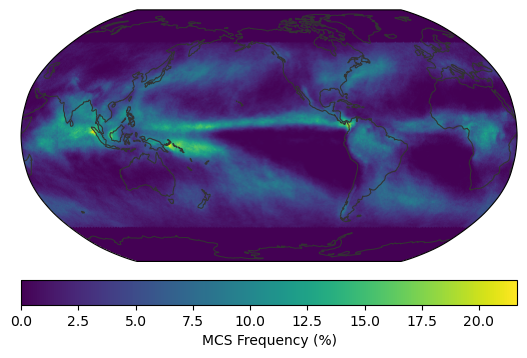

In [12]:
im = egh.healpix_show(mcsfreq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS Frequency (%)')

<Figure size 640x480 with 0 Axes>

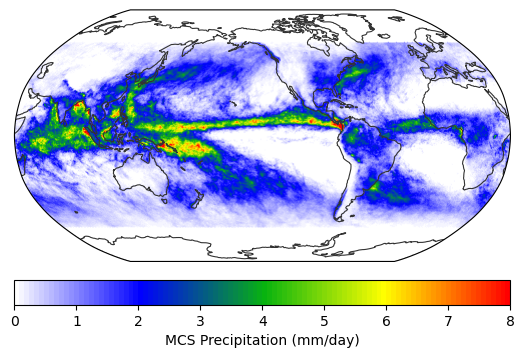

In [13]:
im = egh.healpix_show(mcspcp_all.sel(source='obs'), vmin=0, vmax=8, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS Precipitation (mm/day)')

<Figure size 640x480 with 0 Axes>

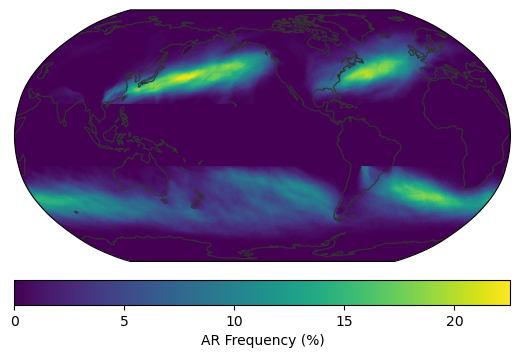

In [14]:
im = egh.healpix_show(arfreq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='AR Frequency (%)')

<Figure size 640x480 with 0 Axes>

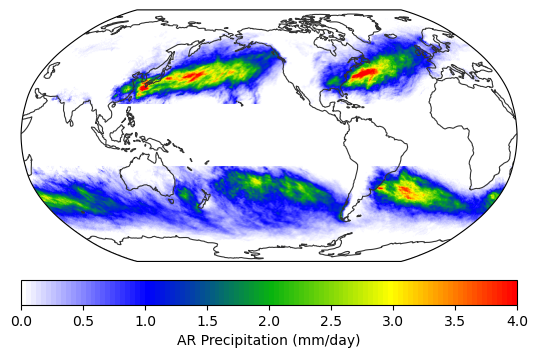

In [15]:
im = egh.healpix_show(arpcp_all.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='AR Precipitation (mm/day)')

<Figure size 640x480 with 0 Axes>

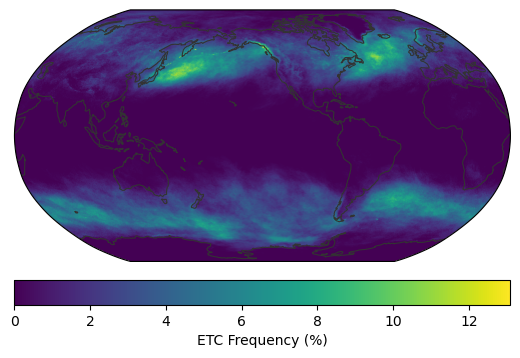

In [16]:
im = egh.healpix_show(etcfreq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='ETC Frequency (%)')

<Figure size 640x480 with 0 Axes>

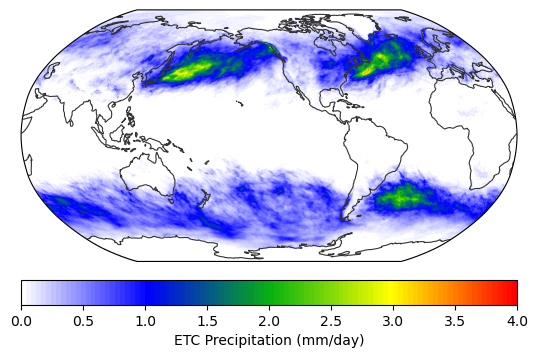

In [17]:
im = egh.healpix_show(etcpcp_all.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='ETC Precipitation (mm/day)')

<Figure size 640x480 with 0 Axes>

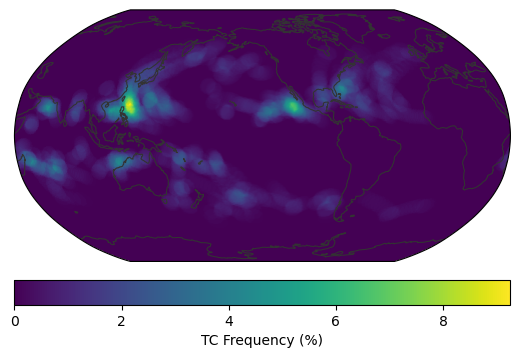

In [18]:
im = egh.healpix_show(tcfreq_all.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='TC Frequency (%)')

<Figure size 640x480 with 0 Axes>

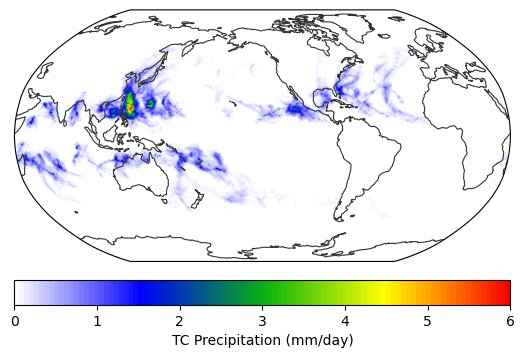

In [19]:
im = egh.healpix_show(tcpcp_all.sel(source='obs'), vmin=0, vmax=6, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='TC Precipitation (mm/day)')

In [20]:
tropics_lat = [-20, 20]
# extratropics_lat = [-90, -20, 20, 90]
tc_lat = [-40, 40]

# Filter features for different latitude bands
mcsfreq_all_trop = mcsfreq_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))
mcspcp_all_trop = mcspcp_all.where((hp_lat >= min(tropics_lat)) & (hp_lat <= max(tropics_lat)))

arfreq_all_extrop = arfreq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
arpcp_all_extrop = arpcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

etcfreq_all_extrop = etcfreq_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))
etcpcp_all_extrop = etcpcp_all.where((hp_lat < min(tropics_lat)) | (hp_lat > max(tropics_lat)))

tcfreq_all_trop = tcfreq_all.where((hp_lat >= min(tc_lat)) & (hp_lat <= max(tc_lat)))
tcpcp_all_trop = tcpcp_all.where((hp_lat >= min(tc_lat)) & (hp_lat <= max(tc_lat)))

<Figure size 640x480 with 0 Axes>

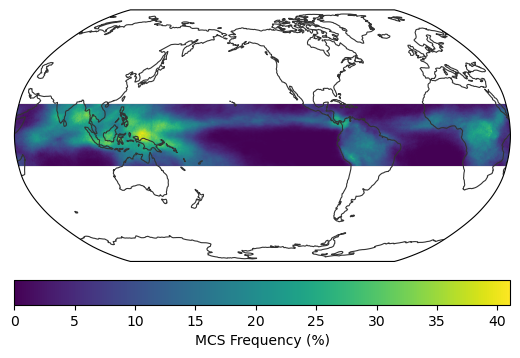

In [21]:
im = egh.healpix_show(mcsfreq_all_trop.sel(source='m2'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS Frequency (%)')

<Figure size 640x480 with 0 Axes>

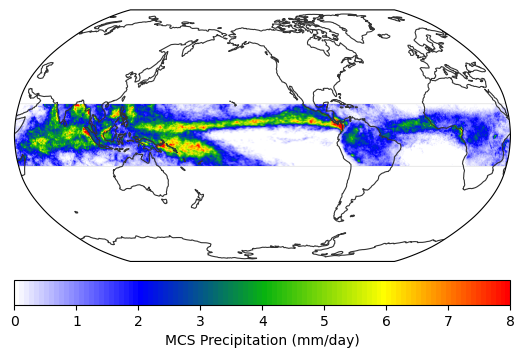

In [22]:
im = egh.healpix_show(mcspcp_all_trop.sel(source='obs'), vmin=0, vmax=8, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='MCS Precipitation (mm/day)')

<Figure size 640x480 with 0 Axes>

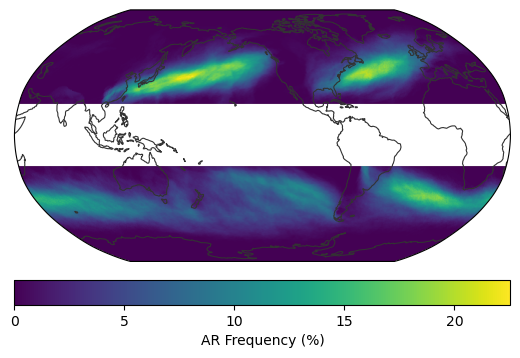

In [23]:
im = egh.healpix_show(arfreq_all_extrop.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='AR Frequency (%)')

<Figure size 640x480 with 0 Axes>

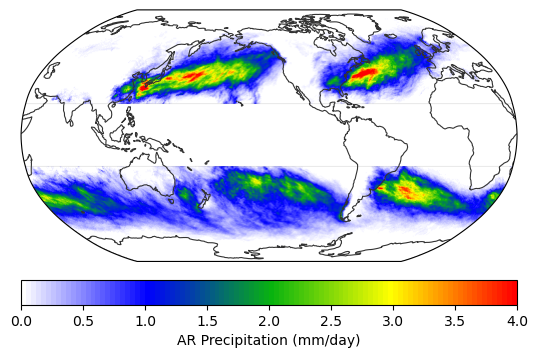

In [24]:
im = egh.healpix_show(arpcp_all_extrop.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='AR Precipitation (mm/day)')

<Figure size 640x480 with 0 Axes>

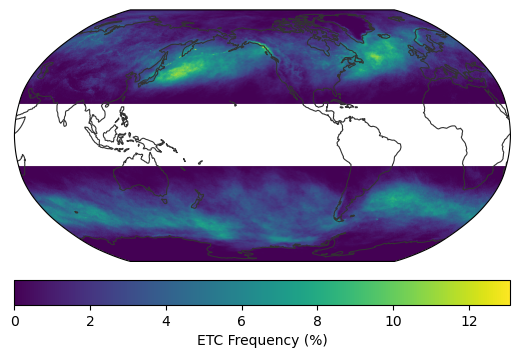

In [25]:
im = egh.healpix_show(etcfreq_all_extrop.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='ETC Frequency (%)')

<Figure size 640x480 with 0 Axes>

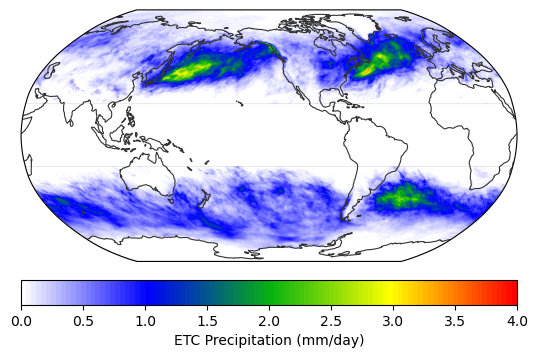

In [26]:
im = egh.healpix_show(etcpcp_all_extrop.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='ETC Precipitation (mm/day)')

<Figure size 640x480 with 0 Axes>

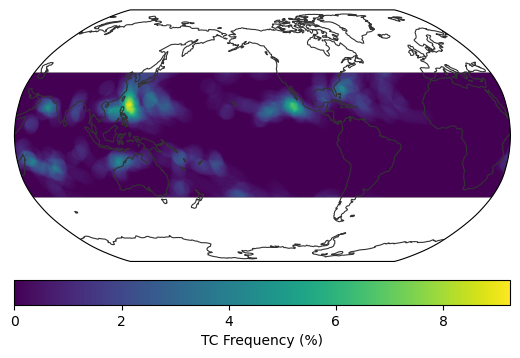

In [27]:
im = egh.healpix_show(tcfreq_all_trop.sel(source='obs'))
plt.colorbar(im, orientation='horizontal', pad=0.05, label='TC Frequency (%)')

<Figure size 640x480 with 0 Axes>

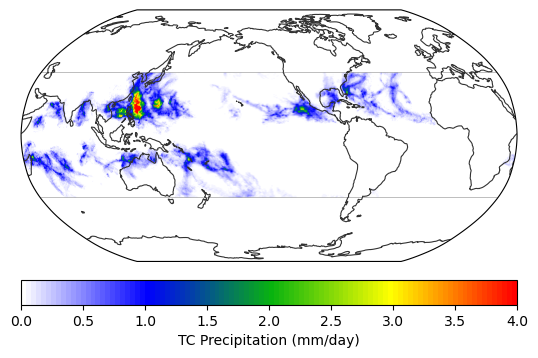

In [28]:
im = egh.healpix_show(tcpcp_all_trop.sel(source='obs'), vmin=0, vmax=4, cmap=cmaps.WhBlGrYeRe)
plt.colorbar(im, orientation='horizontal', pad=0.05, label='TC Precipitation (mm/day)')

In [29]:
# Compute global mean values
mcsfreq_all_trop_avg = mcsfreq_all_trop.mean(dim='cell').compute()
mcspcp_all_trop_avg = mcspcp_all_trop.mean(dim='cell').compute()

arfreq_all_extrop_avg = arfreq_all_extrop.mean(dim='cell').compute()
arpcp_all_extrop_avg = arpcp_all_extrop.mean(dim='cell').compute()

etcfreq_all_extrop_avg = etcfreq_all_extrop.mean(dim='cell').compute()
etcpcp_all_extrop_avg = etcpcp_all_extrop.mean(dim='cell').compute()

tcfreq_all_trop_avg = tcfreq_all_trop.mean(dim='cell').compute()
tcpcp_all_trop_avg = tcpcp_all_trop.mean(dim='cell').compute()

In [30]:
mcsfreq_all_trop_avg, mcspcp_all_trop_avg

(<xarray.DataArray (source: 4)> Size: 16B
 array([4.662493 , 6.0586247, 9.741046 , 1.7738724], dtype=float32)
 Coordinates:
     crs      int64 8B 0
   * source   (source) <U3 48B 'obs' 'm1' 'm2' 'm3',
 <xarray.DataArray (source: 4)> Size: 16B
 array([1.7294073, 1.1098906, 1.7662826, 1.2907561], dtype=float32)
 Coordinates:
     crs      int64 8B 0
   * source   (source) <U3 48B 'obs' 'm1' 'm2' 'm3')

In [31]:
# # Create bar plot comparing feature frequencies across sources
# fig, ax = plt.subplots(figsize=(12, 8))
# fontsize = 18
# mpl.rcParams['font.size'] = fontsize

# # Get the source labels and create nice labels for display
# sources = mcsfreq_all_trop_avg.source.values
# source_labels = [name_map_plot[src] for src in sources]

# # Feature data and labels
# features = ['MCS', 'AR', 'ETC', 'TC']
# feature_data = [
#     mcsfreq_all_trop_avg.values,
#     arfreq_all_extrop_avg.values,
#     etcfreq_all_extrop_avg.values,
#     tcfreq_all_trop_avg.values
# ]

# # Set up the bar positions
# x = np.arange(len(features))  # Feature positions
# width = 0.2  # Width of bars
# # colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Colors for each source
# colors = ['k', 'dodgerblue', 'deeppink', 'darkorange']  # Colors for each source

# # Create bars for each source
# for i, (source_label, color) in enumerate(zip(source_labels, colors)):
#     values = [data[i] for data in feature_data]
#     bars = ax.bar(x + i * width, values, width, label=source_label, color=color, alpha=0.8)
    
#     # Add value labels on top of bars
#     for bar, value in zip(bars, values):
#         height = bar.get_height()
#         ax.text(bar.get_x() + bar.get_width()/2., height + 0.05,
#                 f'{value:.2f}', ha='center', va='bottom', fontsize=fontsize*0.7)

# # Customize the plot
# # ax.set_xlabel('Weather Features', fontsize=fontsize, fontweight='bold')
# ax.set_ylabel('Frequency (%)', fontsize=fontsize, fontweight='bold')
# ax.set_title('Feature Frequency', fontsize=fontsize, fontweight='bold', pad=20)
# ax.set_xticks(x + width * 1.5)
# ax.set_xticklabels(features)
# # ax.legend(title='Data Sources', bbox_to_anchor=(1.05, 1), loc='upper left')
# ax.legend(title='', loc='upper right', fontsize=fontsize*0.8)
# ax.grid(True, alpha=0.3, axis='y')

# # Adjust layout to prevent legend cutoff
# plt.tight_layout()

# # Save the figure
# figname = f'{figdir}feature_frequency_comparison_barplot.png'
# plt.savefig(figname, dpi=300, bbox_inches='tight')
# print(f'Figure saved: {figname}')


In [32]:
# # Create bar plot showing relative differences (model - obs)/obs
# fig, ax = plt.subplots(figsize=(12, 8))
# fontsize = 18
# mpl.rcParams['font.size'] = fontsize

# # Get the source labels (excluding obs for difference calculation)
# sources = mcsfreq_all_trop_avg.source.values
# model_sources = [src for src in sources if src != 'obs']
# model_labels = [name_map_plot[src] for src in model_sources]

# # Feature data and labels
# features = ['MCS', 'AR', 'ETC', 'TC']
# feature_data = [
#     mcsfreq_all_trop_avg.values,
#     arfreq_all_extrop_avg.values,
#     etcfreq_all_extrop_avg.values,
#     tcfreq_all_trop_avg.values
# ]

# # Get obs values (index 0 corresponds to 'obs')
# obs_idx = list(sources).index('obs')
# obs_values = [data[obs_idx] for data in feature_data]

# # Calculate relative differences: (model - obs)/obs * 100
# relative_diffs = []
# for feature_idx in range(len(features)):
#     feature_diffs = []
#     for model_idx, model_src in enumerate(model_sources):
#         model_data_idx = list(sources).index(model_src)
#         model_val = feature_data[feature_idx][model_data_idx]
#         obs_val = obs_values[feature_idx]
#         rel_diff = (model_val - obs_val) / obs_val * 100
#         feature_diffs.append(rel_diff)
#     relative_diffs.append(feature_diffs)

# # Set up the bar positions
# x = np.arange(len(features))  # Feature positions
# width = 0.25  # Width of bars
# colors = ['dodgerblue', 'deeppink', 'darkorange']  # Colors for each model (excluding obs)

# # Create bars for each model
# for i, (model_label, color) in enumerate(zip(model_labels, colors)):
#     values = [diff[i] for diff in relative_diffs]
#     bars = ax.bar(x + i * width, values, width, label=model_label, color=color, alpha=0.8)
    
#     # Add value labels on top of bars
#     for bar, value in zip(bars, values):
#         height = bar.get_height()
#         # Position text above positive bars, below negative bars
#         va = 'bottom' if height >= 0 else 'top'
#         text_y = height + (0.5 if height >= 0 else -0.5)
#         ax.text(bar.get_x() + bar.get_width()/2., text_y,
#                 f'{int(round(value))}%', ha='center', va=va, fontsize=fontsize*0.7)

# # Add horizontal line at y=0 for reference
# ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.8)

# # Customize the plot
# ax.set_ylabel('Relative Difference (%)', fontsize=fontsize, fontweight='bold')
# ax.set_title('Model Feature Frequency Bias', fontsize=fontsize, fontweight='bold', pad=20)
# ax.set_xticks(x + width)
# ax.set_xticklabels(features)
# ax.legend(title='', loc='best', fontsize=fontsize*0.8)
# ax.grid(True, alpha=0.3, axis='y')

# # Set y-axis limits to accommodate all values with some padding
# y_min = min([min(diff) for diff in relative_diffs]) - 10
# y_max = max([max(diff) for diff in relative_diffs]) + 10
# ax.set_ylim(y_min, y_max)

# # Adjust layout
# plt.tight_layout()

# # Save the figure
# figname_diff = f'{figdir}feature_frequency_model_bias_barplot.png'
# plt.savefig(figname_diff, dpi=300, bbox_inches='tight')
# print(f'Model bias figure saved: {figname_diff}')

# plt.show()

## Function to make bar plots

In [36]:
def plot_feature_comparison(feature_data, plot_type='value', figsize=(12, 8), fontsize=18, 
                            xlabel=None, ylabel=None, title=None, ylims=None,
                           figname=None, show_plot=True):
    """
    Plot bar chart for feature comparison or model bias.
    
    Parameters:
    -----------
    feature_data : list
        List of arrays containing feature data [mcs, ar, etc, tc]
    plot_type : str
        'value' for actual values or 'bias' for relative differences
    figsize : tuple
        Figure size (width, height)
    fontsize : int
        Base font size for the plot
    ylims : tuple or None
        Y-axis limits (ymin, ymax). If provided, bar values exceeding limits 
        will have their labels placed within the plot area
    figname : str
        figname for saving (optional)
    show_plot : bool
        Whether to display the plot
    
    Returns:
    --------
    fig, ax : matplotlib figure and axes objects
    """
    
    # Set up the plot
    fig, ax = plt.subplots(figsize=figsize)
    mpl.rcParams['font.size'] = fontsize
    
    # Get source information
    sources = feature_data[0].source.values  # Assuming all have same sources
    features = ['MCS', 'AR', 'ETC', 'TC']
    
    if plot_type == 'value':
        # Plot actual values
        source_labels = [name_map_plot[src] for src in sources]
        colors = ['k', 'dodgerblue', 'deeppink', 'darkorange']
        
        # Extract values for each feature
        values_data = [data.values for data in feature_data]
        
        # Set up bar positions
        x = np.arange(len(features))
        width = 0.2
        
        # Create bars for each source
        for i, (source_label, color) in enumerate(zip(source_labels, colors)):
            values = [data[i] for data in values_data]
            bars = ax.bar(x + i * width, values, width, label=source_label, 
                         color=color, alpha=0.8)
            
            # Add value labels on top of bars
            for bar, value in zip(bars, values):
                height = bar.get_height()
                # Check if ylims is provided and if bar exceeds limits
                if ylims is not None and height > ylims[1]:
                    # Place label within plot area for bars exceeding upper limit
                    text_y = ylims[1] - (ylims[1] - ylims[0]) * 0.1  # 10% from top
                    va = 'top'
                else:
                    # Standard placement above bar - scale offset with ylims if provided
                    if ylims is not None:
                        offset = (ylims[1] - ylims[0]) * 0.02  # 2% of y-range
                    else:
                        offset = 0.05  # Fixed offset when no ylims
                    text_y = height + offset
                    va = 'bottom'
                
                ax.text(bar.get_x() + bar.get_width()/2., text_y,
                        f'{value:.2f}', ha='center', va=va, fontsize=fontsize*0.7)
        
        # Customize plot
        ax.set_ylabel(ylabel, fontsize=fontsize, fontweight='bold')
        ax.set_title(title, fontsize=fontsize, fontweight='bold', pad=20)
        ax.set_xticks(x + width * 1.5)
        ax.legend(title='', loc='upper right', fontsize=fontsize*0.8)
                
    elif plot_type == 'bias':
        # Plot relative differences (model - obs)/obs
        model_sources = [src for src in sources if src != 'obs']
        model_labels = [name_map_plot[src] for src in model_sources]
        colors = ['dodgerblue', 'deeppink', 'darkorange']
        
        # Get obs values (index 0 corresponds to 'obs')
        obs_idx = list(sources).index('obs')
        obs_values = [data.values[obs_idx] for data in feature_data]
        
        # Calculate relative differences: (model - obs)/obs * 100
        relative_diffs = []
        for feature_idx in range(len(features)):
            feature_diffs = []
            for model_src in model_sources:
                model_data_idx = list(sources).index(model_src)
                model_val = feature_data[feature_idx].values[model_data_idx]
                obs_val = obs_values[feature_idx]
                rel_diff = (model_val - obs_val) / obs_val * 100
                feature_diffs.append(rel_diff)
            relative_diffs.append(feature_diffs)
        
        # Set up bar positions
        x = np.arange(len(features))
        width = 0.25
        
        # Create bars for each model
        for i, (model_label, color) in enumerate(zip(model_labels, colors)):
            values = [diff[i] for diff in relative_diffs]
            bars = ax.bar(x + i * width, values, width, label=model_label, 
                         color=color, alpha=0.8)
            
            # Add value labels on top of bars
            for bar, value in zip(bars, values):
                height = bar.get_height()
                # Check if ylims is provided and if bar exceeds limits
                if ylims is not None:
                    if height > ylims[1]:
                        # Place label within plot area for bars exceeding upper limit
                        text_y = ylims[1] - (ylims[1] - ylims[0]) * 0.05  # 5% from top
                        va = 'top'
                    elif height < ylims[0]:
                        # Place label within plot area for bars exceeding lower limit
                        text_y = ylims[0] + (ylims[1] - ylims[0]) * 0.05  # 5% from bottom
                        va = 'bottom'
                    else:
                        # Standard placement relative to bar - scale offset with ylims
                        offset = (ylims[1] - ylims[0]) * 0.02  # 2% of y-range
                        va = 'bottom' if height >= 0 else 'top'
                        text_y = height + (offset if height >= 0 else -offset)
                else:
                    # Standard placement relative to bar - use fraction of auto y-range when no ylims
                    va = 'bottom' if height >= 0 else 'top'
                    # Calculate auto y-range for relative offset
                    y_min_auto = min([min(diff) for diff in relative_diffs]) - 10
                    y_max_auto = max([max(diff) for diff in relative_diffs]) + 10
                    offset = (y_max_auto - y_min_auto) * 0.02  # 2% of auto y-range
                    text_y = height + (offset if height >= 0 else -offset)
                
                ax.text(bar.get_x() + bar.get_width()/2., text_y,
                        f'{int(round(value))}%', ha='center', va=va, fontsize=fontsize*0.7)
        
        # Add horizontal line at y=0 for reference
        ax.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.8)
        
        # Customize plot
        ax.set_ylabel(ylabel, fontsize=fontsize, fontweight='bold')
        ax.set_title(title, fontsize=fontsize, fontweight='bold', pad=20)
        ax.set_xticks(x + width)
        ax.legend(title='', loc='best', fontsize=fontsize*0.8)
        
        # Set y-axis limits to accommodate all values with some padding
        y_min = min([min(diff) for diff in relative_diffs]) - 10
        y_max = max([max(diff) for diff in relative_diffs]) + 10
        ax.set_ylim(y_min, y_max)
            
    else:
        raise ValueError("plot_type must be either 'frequency' or 'bias'")
    
    # Common plot settings
    ax.set_xticklabels(features)
    ax.grid(True, alpha=0.3, axis='y')
    
    # Set y-axis limits if provided
    if ylims is not None:
        ax.set_ylim(ylims)
    
    plt.tight_layout()
    
    # Save figure if directory is provided
    if figname:
        plt.savefig(figname, dpi=300, bbox_inches='tight')
        print(f'Figure saved: {figname}')
    
    # Show plot if requested
    if show_plot:
        plt.show()
    
    return fig, ax

<>:18: SyntaxWarning: invalid escape sequence '\D'
<>:18: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_726410/1108470111.py:18: SyntaxWarning: invalid escape sequence '\D'
  ylabel = '$\Delta$Frequency [Model - Obs] (%)'


Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures/feature_frequency_comparison_barplot.png


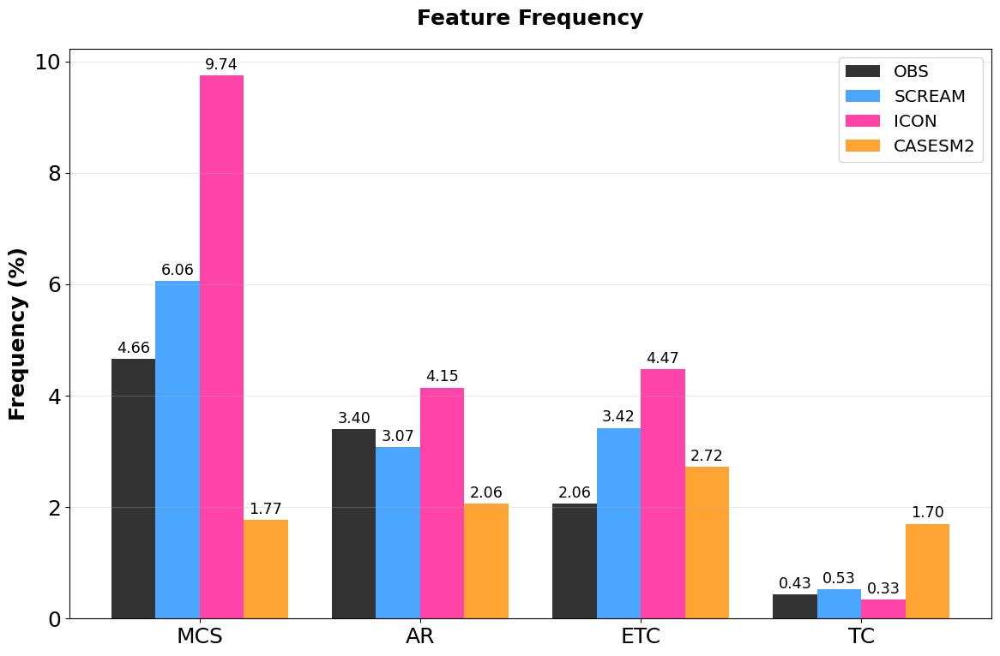

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures/feature_frequency_model_bias_barplot.png


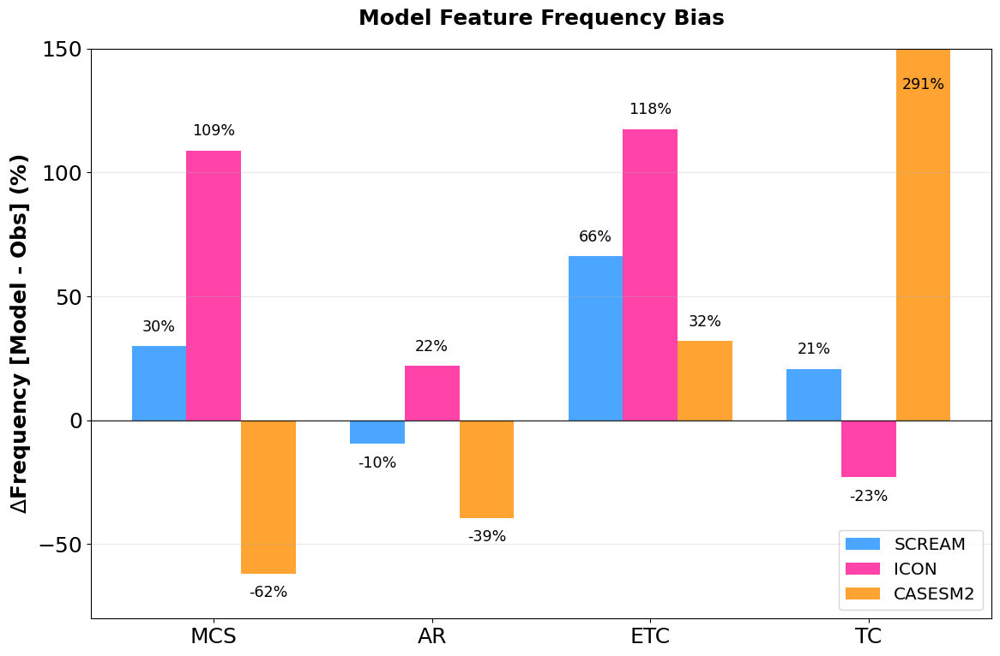

In [37]:
# Prepare feature data
feature_data = [
    mcsfreq_all_trop_avg,
    arfreq_all_extrop_avg,
    etcfreq_all_extrop_avg,
    tcfreq_all_trop_avg
]

# Plot actual frequency values
ylims = None
ylabel = 'Frequency (%)'
title = 'Feature Frequency'
figname = f'{figdir}feature_frequency_comparison_barplot.png'
fig1, ax1 = plot_feature_comparison(feature_data, plot_type='value', ylabel=ylabel, ylims=ylims, title=title, figname=figname, show_plot=True)

# Plot model bias (relative differences)
ylims = (-80, 150)
ylabel = '$\Delta$Frequency [Model - Obs] (%)'
title = 'Model Feature Frequency Bias'
figname = f'{figdir}feature_frequency_model_bias_barplot.png'
fig2, ax2 = plot_feature_comparison(feature_data, plot_type='bias', ylabel=ylabel, ylims=ylims, title=title, figname=figname, show_plot=True)

<>:18: SyntaxWarning: invalid escape sequence '\D'
<>:18: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_726410/1454036412.py:18: SyntaxWarning: invalid escape sequence '\D'
  ylabel = '$\Delta$Precipitation [Model - Obs] (%)'


Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures/feature_precipitation_comparison_barplot.png


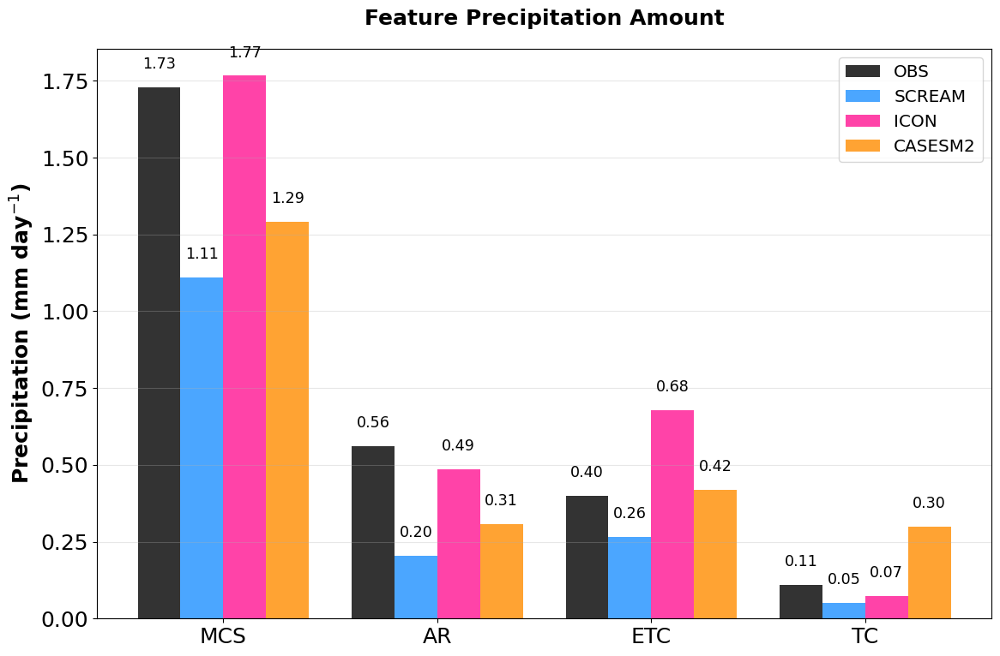

Figure saved: /global/cfs/cdirs/m1867/zfeng/hk25/figures/feature_precipitation_model_bias_barplot.png


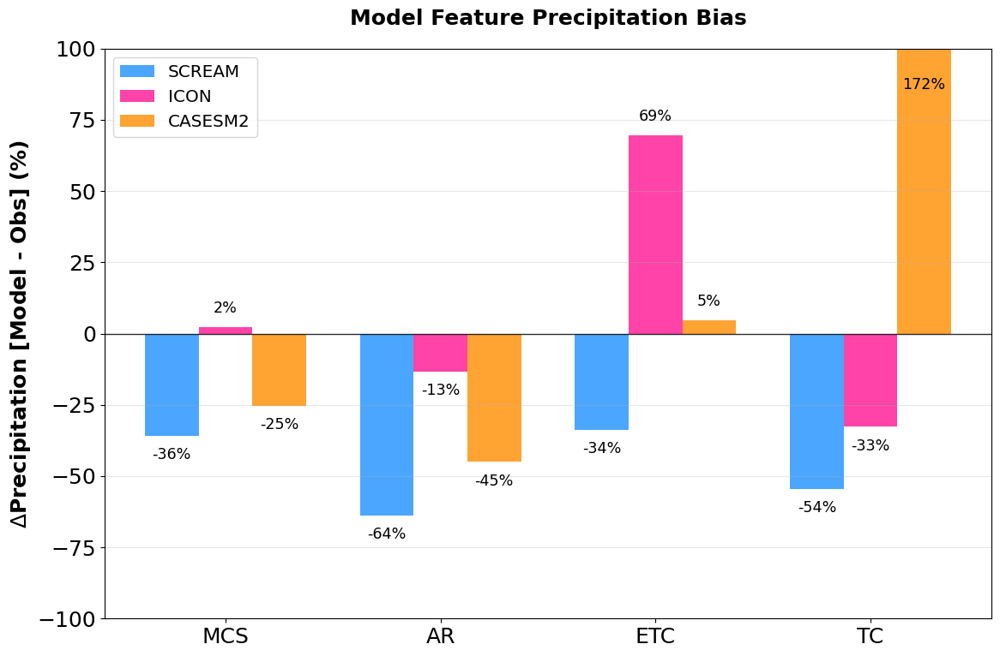

In [38]:
# Prepare feature data
feature_data = [
    mcspcp_all_trop_avg,
    arpcp_all_extrop_avg,
    etcpcp_all_extrop_avg,
    tcpcp_all_trop_avg
]

# Plot actual frequency values
ylims = None
ylabel = 'Precipitation (mm day$^{-1}$)'
title = 'Feature Precipitation Amount'
figname = f'{figdir}feature_precipitation_comparison_barplot.png'
fig1, ax1 = plot_feature_comparison(feature_data, plot_type='value', ylabel=ylabel, ylims=ylims, title=title, figname=figname, show_plot=True)

# Plot model bias (relative differences)
ylims = (-100, 100)
ylabel = '$\Delta$Precipitation [Model - Obs] (%)'
title = 'Model Feature Precipitation Bias'
figname = f'{figdir}feature_precipitation_model_bias_barplot.png'
fig2, ax2 = plot_feature_comparison(feature_data, plot_type='bias', ylabel=ylabel, ylims=ylims, title=title, figname=figname, show_plot=True)

## Function to plot multiple maps

In [69]:
def plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname, 
                  min_thresh=None, wspace=None, hspace=None, oob_colors=None, 
                  contourf=False, figsize=None, fontsize=None, cb_fontsize=None, 
                  show_cb2=False, figtitle=None, dpi=200, lat_lines=None):
    """
    Plot a grid of maps with flexible dimensions
    
    Parameters:
    -----------
    da_list : list of lists
        2D list of xarray DataArrays to plot, dimensions should be [nrow][ncol]
    titles : list of lists
        2D list of titles for each panel, dimensions should be [nrow][ncol]
    levels, colormaps, etc.: can be single values applied to all panels or lists of lists matching da_list
    lat_lines : list or None
        List of latitude values to plot as horizontal lines (e.g., [-20, 20] for tropics)
    """
    # Get grid dimensions from input data
    nrow = len(da_list)
    ncol = len(da_list[0]) if nrow > 0 else 0
    
    # Handle case where parameters might be the same for all panels
    def ensure_grid_format(param, param_name):
        if not isinstance(param, list):
            # If single value provided, apply to all panels
            return [[param for _ in range(ncol)] for _ in range(nrow)]
        elif isinstance(param, list):
            if len(param) == 0:
                # Empty list
                return [[[] for _ in range(ncol)] for _ in range(nrow)]
            elif isinstance(param[0], list):
                # Already a list of lists, return as is
                return param
            else:
                # It's a 1D list (like levels=[1,2,3,5,7,10]), use same list for all panels
                return [[param for _ in range(ncol)] for _ in range(nrow)]
        return param
    
    # Ensure all parameters have proper grid format
    colormaps = ensure_grid_format(colormaps, "colormaps")
    levels = ensure_grid_format(levels, "levels")
    cbticks = ensure_grid_format(cbticks, "cbticks")
    
    mpl.rcParams['font.size'] = fontsize
    map_extent = [0, 360, -60, 60]
    proj = ccrs.Robinson(central_longitude=225)
    data_proj = ccrs.PlateCarree()
    resolution = '110m'
    land = cf.NaturalEarthFeature('physical', 'land', resolution)
    ocean = cf.NaturalEarthFeature('physical', 'ocean', resolution)
    borders = cf.NaturalEarthFeature('cultural', 'admin_0_boundary_lines_land', resolution)

    fig = plt.figure(figsize=figsize, dpi=100)
    # Setup two columns (left: plots, right: colorbar)
    gs0 = gridspec.GridSpec(1, 2, figure=fig, height_ratios=[1], width_ratios=[1,0.02], wspace=0.05)
    # Setup panels to the left
    h_ratios = list(np.repeat(1, nrow))
    w_ratios = list(np.repeat(1, ncol))
    gs = gridspec.GridSpecFromSubplotSpec(nrow, ncol, subplot_spec=gs0[0], 
                                         height_ratios=h_ratios, width_ratios=w_ratios, 
                                         wspace=wspace, hspace=hspace)
    
    # Loop over each panel in the grid
    cf1 = None  # Will store the last plot for colorbar
    for row in range(nrow):
        for col in range(ncol):
            # Get panel index
            panel_idx = row * ncol + col
            
            # Create subplot
            ax = plt.subplot(gs[panel_idx], projection=proj)
            ax.set_global()
            ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
            ax.set_aspect('auto', adjustable=None)
            
            # Add title
            flabel = ax.text(0.02, 0.94, titles[row][col], transform=ax.transAxes, fontsize=fontsize)
            flabel.set_bbox(dict(facecolor='w', alpha=0.8, edgecolor='w'))
            
            # Add gridlines
            gl = ax.gridlines(crs=proj, draw_labels=False, linestyle='--', linewidth=0.5)
            
            # Get data for this panel
            Var = da_list[row][col]
            
            # Apply minimum threshold if provided
            if min_thresh is not None:
                Var = Var.where(Var > min_thresh)
            
            # Setup colormap
            cmap = copy.copy(mpl.colormaps.get_cmap(colormaps[row][col]))
            
            # Set out-of-bounds colors
            if oob_colors is not None:
                oob_c = oob_colors
                if oob_c is not None:
                    cmap.set_over(oob_c['over'])
                    cmap.set_under(oob_c['under'])
            
            # Create color normalization
            norm = colors.BoundaryNorm(boundaries=levels[row][col], ncolors=cmap.N)
            
            # Plot data
            if not contourf:
                cf1 = egh.healpix_show(Var, ax=ax, cmap=cmap, norm=norm, zorder=2)            
            else:
                cf1 = egh.healpix_contour(Var, ax=ax, norm=norm, cmap=cmap, transform=data_proj, zorder=2)
            
            # Add latitude lines if specified
            if lat_lines is not None:
                for lat in lat_lines:
                    # Create longitude array spanning the globe
                    lons = np.linspace(-180, 180, 361)
                    lats = np.full_like(lons, lat)
                    ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5, 
                           transform=data_proj, zorder=4, alpha=0.8)
    
    # Add colorbar (using the last plotted data)
    if cf1 is not None:
        cax = plt.subplot(gs0[1])
        cbar = plt.colorbar(cf1, cax=cax, label=cblabels, ticks=cbticks[row][col], 
                           orientation='vertical', extend='both')
    
    # Add suptitle
    if figtitle:
        fig.suptitle(figtitle, y=0.92, fontweight='bold')
    
    # Save figure
    fig.savefig(figname, dpi=dpi, bbox_inches='tight', facecolor='w')
    return fig

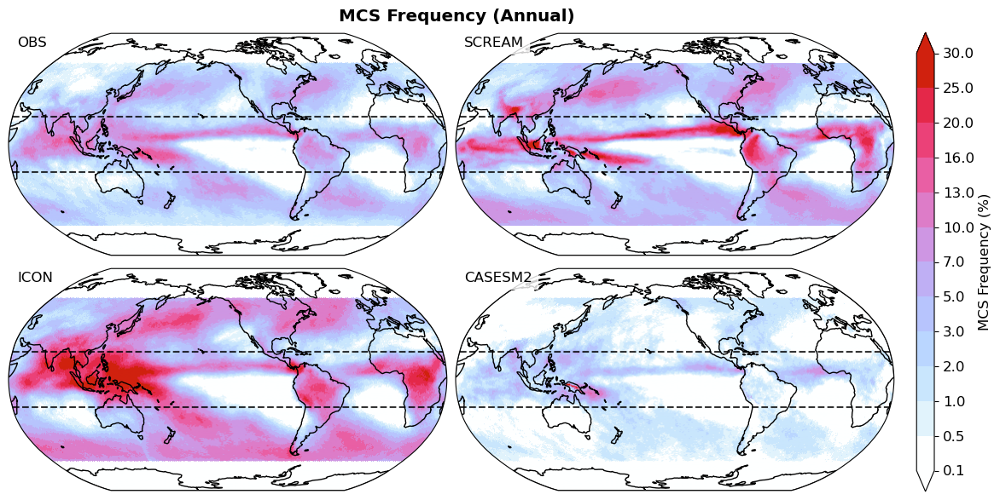

In [70]:
# Create 2D lists for data and titles
da_list = [
    [mcsfreq_all.sel(source='obs'), mcsfreq_all.sel(source='m1')],
    [mcsfreq_all.sel(source='m2'), mcsfreq_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'MCS Frequency'
units = '%'
figtitle = 'MCS Frequency (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = [0.1,0.5,1,2,3,5,7,10,13,16,20,25,30]
min_thresh = None
colormaps = cmaps.cet_l_wcmr
cbticks = levels
oob_colors = None
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_freq_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

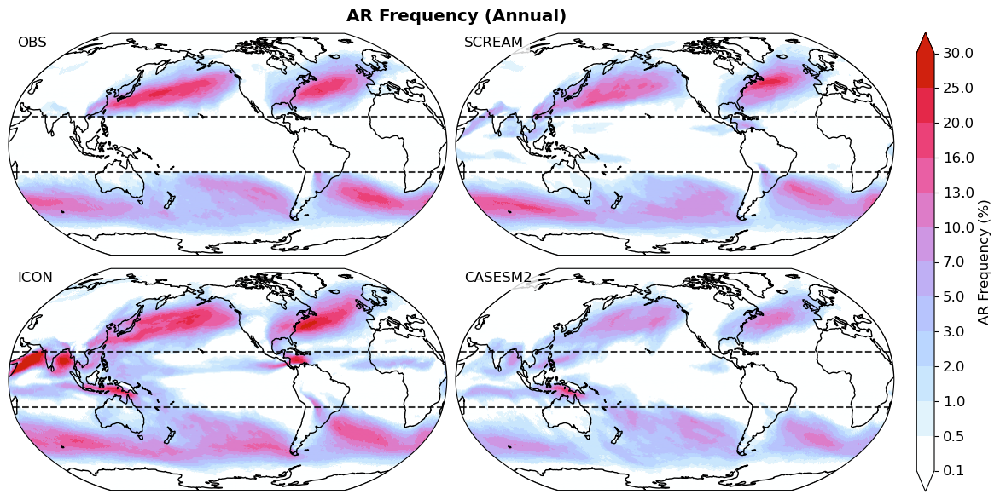

In [71]:
# Create 2D lists for data and titles
da_list = [
    [arfreq_all.sel(source='obs'), arfreq_all.sel(source='m1')],
    [arfreq_all.sel(source='m2'), arfreq_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'AR Frequency'
units = '%'
figtitle = 'AR Frequency (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = [0.1,0.5,1,2,3,5,7,10,13,16,20,25,30]
min_thresh = None
colormaps = cmaps.cet_l_wcmr
cbticks = levels
oob_colors = None
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_ar_freq_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

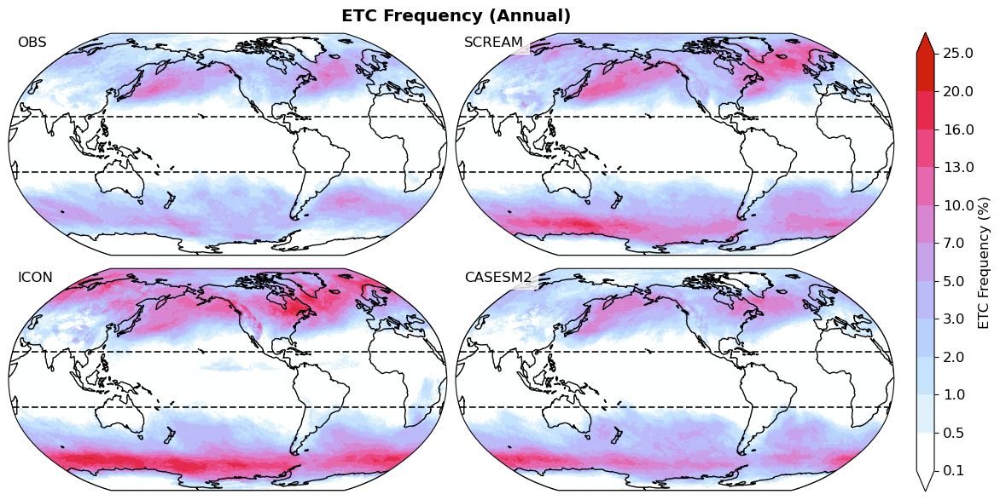

In [ ]:
# Create 2D lists for data and titles
da_list = [
    [etcfreq_all.sel(source='obs'), etcfreq_all.sel(source='m1')],
    [etcfreq_all.sel(source='m2'), etcfreq_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'ETC Frequency'
units = '%'
figtitle = 'ETC Frequency (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = [0.1,0.5,1,2,3,5,7,10,13,16,20,25]
min_thresh = None
colormaps = cmaps.cet_l_wcmr
cbticks = levels
oob_colors = None
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_etc_freq_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

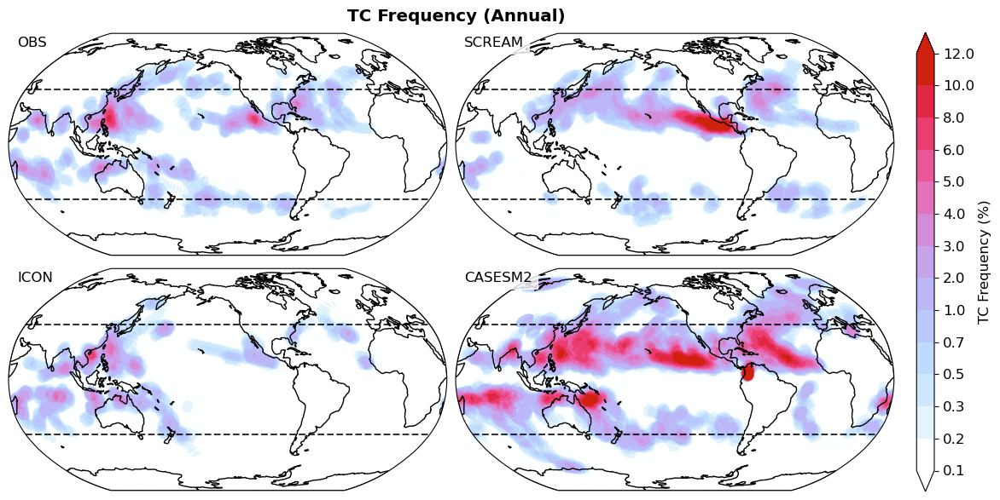

In [73]:
# Create 2D lists for data and titles
da_list = [
    [tcfreq_all.sel(source='obs'), tcfreq_all.sel(source='m1')],
    [tcfreq_all.sel(source='m2'), tcfreq_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'TC Frequency'
units = '%'
figtitle = 'TC Frequency (Annual)'
lat_lines = tc_lat

# Setup levels and colormap
levels = [0.1,0.2,0.3,0.5,0.7,1,2,3,4,5,6,8,10,12]
min_thresh = None
colormaps = cmaps.cet_l_wcmr
cbticks = levels
oob_colors = None
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_tc_freq_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

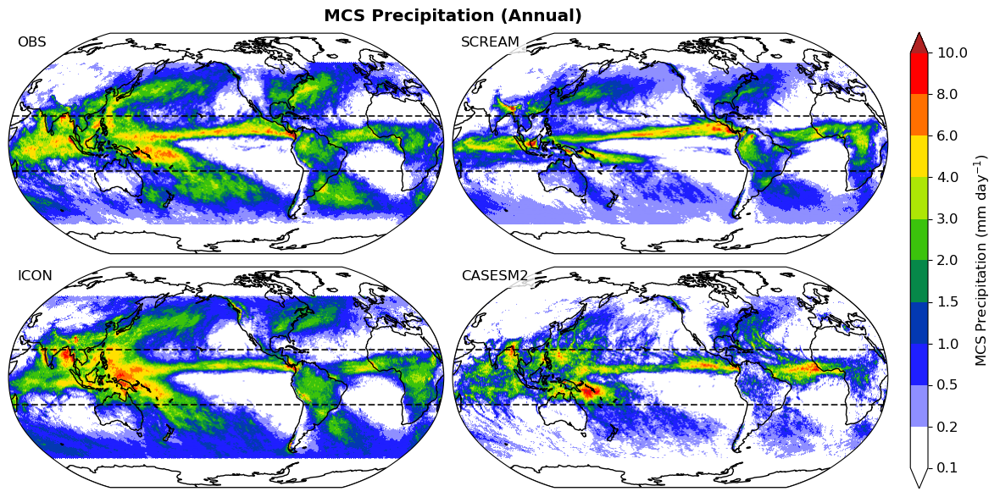

In [80]:
# Create 2D lists for data and titles
da_list = [
    [mcspcp_all.sel(source='obs'), mcspcp_all.sel(source='m1')],
    [mcspcp_all.sel(source='m2'), mcspcp_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'MCS Precipitation'
units = 'mm day$^{-1}$'
figtitle = 'MCS Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
min_thresh = None
colormaps = cmaps.WhBlGrYeRe
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_mcs_rain_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

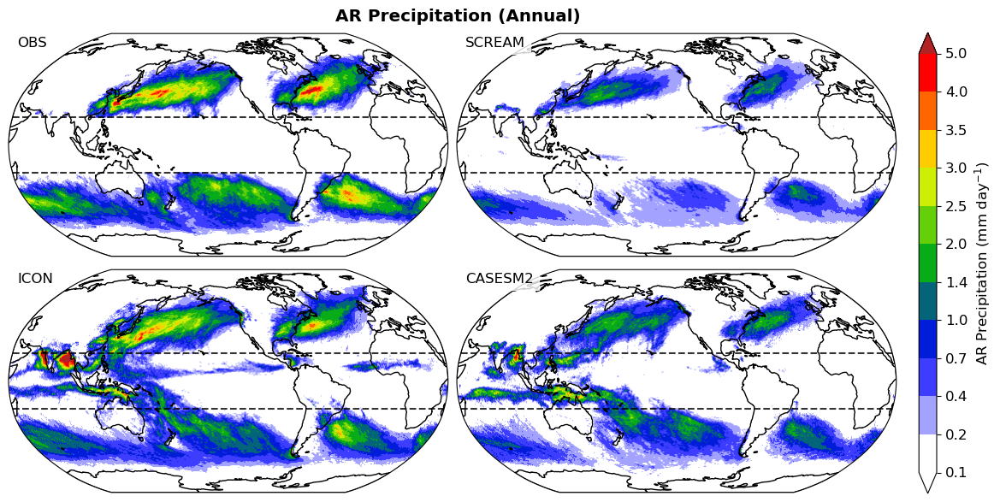

In [81]:
# Create 2D lists for data and titles
da_list = [
    [arpcp_all.sel(source='obs'), arpcp_all.sel(source='m1')],
    [arpcp_all.sel(source='m2'), arpcp_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'AR Precipitation'
units = 'mm day$^{-1}$'
figtitle = 'AR Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = [0.1,0.2,0.4,0.7,1.0,1.4,2,2.5,3,3.5,4,5]
min_thresh = None
colormaps = cmaps.WhBlGrYeRe
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_ar_rain_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

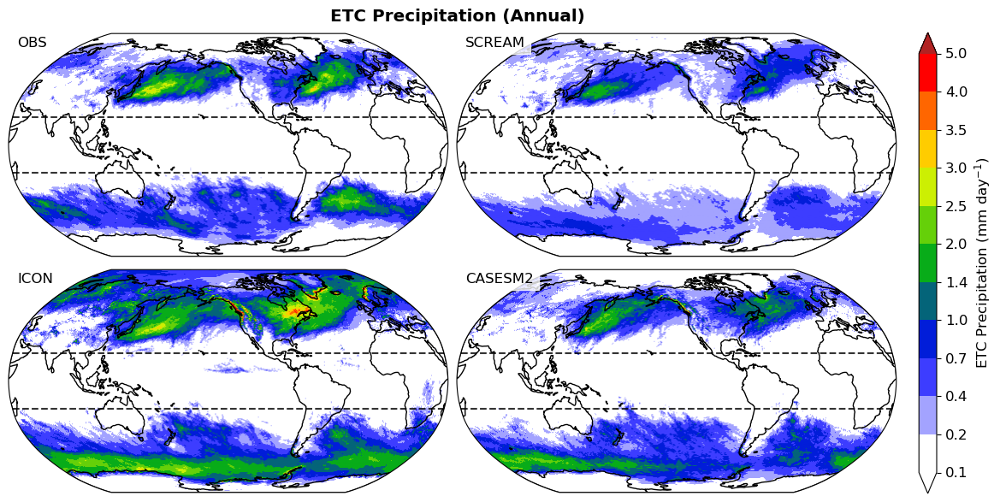

In [82]:
# Create 2D lists for data and titles
da_list = [
    [etcpcp_all.sel(source='obs'), etcpcp_all.sel(source='m1')],
    [etcpcp_all.sel(source='m2'), etcpcp_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'ETC Precipitation'
units = 'mm day$^{-1}$'
figtitle = 'ETC Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = [0.1,0.2,0.4,0.7,1.0,1.4,2,2.5,3,3.5,4,5]
min_thresh = None
colormaps = cmaps.WhBlGrYeRe
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_etc_rain_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

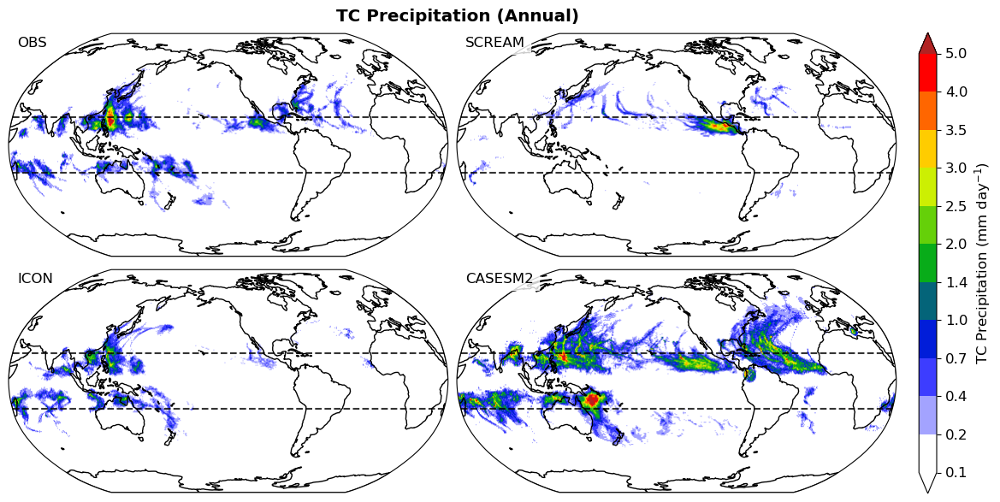

In [83]:
# Create 2D lists for data and titles
da_list = [
    [tcpcp_all.sel(source='obs'), tcpcp_all.sel(source='m1')],
    [tcpcp_all.sel(source='m2'), tcpcp_all.sel(source='m3')],
]
titles = [
    [f"{name_map_plot['obs']}", f"{name_map_plot['m1']}"],
    [f"{name_map_plot['m2']}", f"{name_map_plot['m3']}"]
]

# Setup grid parameters
nrow = len(da_list)
ncol = len(da_list[0]) if nrow > 0 else 1
figwidth = 14
height_ratio_per_panel = 0.5
figheight = nrow * (figwidth / ncol) * height_ratio_per_panel
figsize = [figwidth, figheight]
fontsize = 12
cb_fontsize = 10
wspace = 0.02
hspace = 0.05
varname1 = 'TC Precipitation'
units = 'mm day$^{-1}$'
figtitle = 'TC Precipitation (Annual)'
lat_lines = tropics_lat

# Setup levels and colormap
levels = [0.1,0.2,0.4,0.7,1.0,1.4,2,2.5,3,3.5,4,5]
min_thresh = None
colormaps = cmaps.WhBlGrYeRe
cbticks = levels
oob_colors = {'over':'firebrick', 'under':'white'}
cblabels = f'{varname1} ({units})'
figname = f'{figdir}globalmap_tc_rain_annual.png'

# Plot figure
fig = plot_maps_grid(da_list, titles, levels, colormaps, cblabels, cbticks, figname,
                    figtitle=figtitle, lat_lines=lat_lines,
                    min_thresh=min_thresh, wspace=wspace, hspace=hspace, figsize=figsize,
                    fontsize=fontsize, cb_fontsize=cb_fontsize, contourf=False,
                    oob_colors=oob_colors, show_cb2=False, dpi=200)

## Function to plot difference maps

In [97]:
def plot_maps_obs_and_diffs(obs_data, model_data_list, titles, 
                           obs_levels, diff_levels, obs_colormap, diff_colormap, 
                           obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                           obs_oob_colors=None, diff_oob_colors=None,
                           min_thresh=None, wspace=None, hspace=None, 
                           figsize=None, fontsize=None, cb_fontsize=None, 
                           figtitle=None, dpi=200, lat_lines=None):
    """
    Plot OBS data in first panel and model differences (model - obs) in remaining panels.
    Two horizontal colorbars are placed below the plot grid.
    
    Parameters:
    -----------
    obs_data : xarray.DataArray
        Observational data for the first panel
    model_data_list : list
        List of model xarray.DataArrays for difference calculation
    titles : list
        List of titles for each panel (obs + models)
    obs_levels : list
        Color levels for observational data
    diff_levels : list
        Color levels for difference data
    obs_colormap : str
        Colormap name for observational data
    diff_colormap : str
        Colormap name for difference data
    obs_cblabel : str
        Label for observational colorbar
    diff_cblabel : str
        Label for difference colorbar
    obs_cbticks : list
        Tick values for observational colorbar
    diff_cbticks : list
        Tick values for difference colorbar
    figname : str
        Output filename
    obs_oob_colors : dict or None
        Out-of-bounds colors for observational data
    diff_oob_colors : dict or None
        Out-of-bounds colors for difference data
    min_thresh : float or None
        Minimum threshold for data display
    wspace : float or None
        Width space between subplots
    hspace : float or None
        Height space between subplots
    figtitle : str or None
        Title for the entire figure
    figsize : tuple or None
        Figure size (width, height) in inches
    fontsize : float or None
        Font size for text elements
    cb_fontsize : float or None
        Font size for colorbar text elements
    lat_lines : list or None
        List of latitude values to plot as horizontal lines
    """
    
    # Calculate grid dimensions
    total_panels = 1 + len(model_data_list)  # obs + models
    ncol = int(np.ceil(np.sqrt(total_panels)))
    nrow = int(np.ceil(total_panels / ncol))
    
    # Calculate difference data
    diff_data_list = []
    for model_data in model_data_list:
        diff_data = model_data - obs_data
        diff_data_list.append(diff_data)
    
    # Set up matplotlib parameters
    mpl.rcParams['font.size'] = fontsize
    proj = ccrs.Robinson(central_longitude=225)
    data_proj = ccrs.PlateCarree()
    resolution = '110m'
    land = cf.NaturalEarthFeature('physical', 'land', resolution)
    
    # Create figure with custom grid layout
    fig = plt.figure(figsize=figsize, dpi=100)
    
    # Main grid for maps (leave space for colorbars at bottom)
    gs_main = gridspec.GridSpec(2, 1, figure=fig, height_ratios=[1, 0.05], hspace=0.05)
    
    # Subplot grid for maps
    gs_maps = gridspec.GridSpecFromSubplotSpec(nrow, ncol, subplot_spec=gs_main[0], wspace=wspace, hspace=hspace)
    
    # Subplot grid for colorbars (2 columns for 2 colorbars)
    gs_cbar = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_main[1], wspace=wspace, hspace=0)
    
    # Set up colormaps
    obs_cmap = copy.copy(mpl.colormaps.get_cmap(obs_colormap))
    diff_cmap = copy.copy(mpl.colormaps.get_cmap(diff_colormap))

    # Set out-of-bounds colors
    if obs_oob_colors is not None:
        oob_c = obs_oob_colors
        if oob_c is not None:
            obs_cmap.set_over(oob_c['over'])
            obs_cmap.set_under(oob_c['under'])
    if diff_oob_colors is not None:
        oob_c = diff_oob_colors
        if oob_c is not None:
            diff_cmap.set_over(oob_c['over'])
            diff_cmap.set_under(oob_c['under'])

    # Color normalizations
    obs_norm = colors.BoundaryNorm(boundaries=obs_levels, ncolors=obs_cmap.N)
    diff_norm = colors.BoundaryNorm(boundaries=diff_levels, ncolors=diff_cmap.N)
    
    # Variables to store plot objects for colorbars
    obs_plot = None
    diff_plot = None
    
    # Plot data panels
    panel_idx = 0
    
    # First panel: Observational data
    row = panel_idx // ncol
    col = panel_idx % ncol
    ax = plt.subplot(gs_maps[row, col], projection=proj)
    ax.set_global()
    ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
    ax.set_aspect('auto', adjustable=None)
    
    # Add title
    ax.set_title(titles[0], fontsize=fontsize, loc='center')
    # flabel = ax.text(0.02, 0.94, titles[0], transform=ax.transAxes, fontsize=fontsize)
    # flabel.set_bbox(dict(facecolor='w', alpha=0.8, edgecolor='w'))
    
    # Add gridlines
    gl = ax.gridlines(crs=proj, draw_labels=False, linestyle='--', linewidth=0.5)
    
    # Apply minimum threshold if provided
    plot_data = obs_data
    if min_thresh is not None:
        plot_data = plot_data.where(plot_data > min_thresh)
    
    # Plot observational data
    obs_plot = egh.healpix_show(plot_data, ax=ax, cmap=obs_cmap, norm=obs_norm, zorder=2)
    
    # Add latitude lines if specified
    if lat_lines is not None:
        for lat in lat_lines:
            lons = np.linspace(-180, 180, 361)
            lats = np.full_like(lons, lat)
            ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5, 
                   transform=data_proj, zorder=4, alpha=0.8)
    
    panel_idx += 1
    
    # Remaining panels: Model differences
    for i, (diff_data, title) in enumerate(zip(diff_data_list, titles[1:])):
        row = panel_idx // ncol
        col = panel_idx % ncol
        ax = plt.subplot(gs_maps[row, col], projection=proj)
        ax.set_global()
        ax.add_feature(land, facecolor='none', edgecolor='k', zorder=3)
        ax.set_aspect('auto', adjustable=None)
        
        # Add title
        ax.set_title(title, fontsize=fontsize, loc='center')
        # flabel = ax.text(0.02, 0.94, title, transform=ax.transAxes, fontsize=fontsize)
        # flabel.set_bbox(dict(facecolor='w', alpha=0.8, edgecolor='w'))
        
        # Add gridlines
        gl = ax.gridlines(crs=proj, draw_labels=False, linestyle='--', linewidth=0.5)
        
        # Plot difference data
        diff_plot = egh.healpix_show(diff_data, ax=ax, cmap=diff_cmap, norm=diff_norm, zorder=2)
        
        # Add latitude lines if specified
        if lat_lines is not None:
            for lat in lat_lines:
                lons = np.linspace(-180, 180, 361)
                lats = np.full_like(lons, lat)
                ax.plot(lons, lats, color='k', linestyle='--', linewidth=1.5, 
                       transform=data_proj, zorder=4, alpha=0.8)
        
        panel_idx += 1
    
    # Hide empty subplots
    for idx in range(panel_idx, nrow * ncol):
        row = idx // ncol
        col = idx % ncol
        ax = plt.subplot(gs_maps[row, col])
        ax.set_visible(False)
    
    # Add horizontal colorbars
    if obs_plot is not None:
        cax_obs = plt.subplot(gs_cbar[0])
        cbar_obs = plt.colorbar(obs_plot, cax=cax_obs, label=obs_cblabel, 
                               ticks=obs_cbticks, orientation='horizontal', extend='both')
        cbar_obs.ax.tick_params(labelsize=cb_fontsize)
    
    if diff_plot is not None:
        cax_diff = plt.subplot(gs_cbar[1])
        cbar_diff = plt.colorbar(diff_plot, cax=cax_diff, label=diff_cblabel, 
                                ticks=diff_cbticks, orientation='horizontal', extend='both')
        cbar_diff.ax.tick_params(labelsize=cb_fontsize)
    
    # Add suptitle
    if figtitle:
        fig.suptitle(figtitle, y=0.95, fontweight='bold', fontsize=fontsize+2)
    
    # Save figure
    fig.savefig(figname, dpi=dpi, bbox_inches='tight', facecolor='w')
    return fig

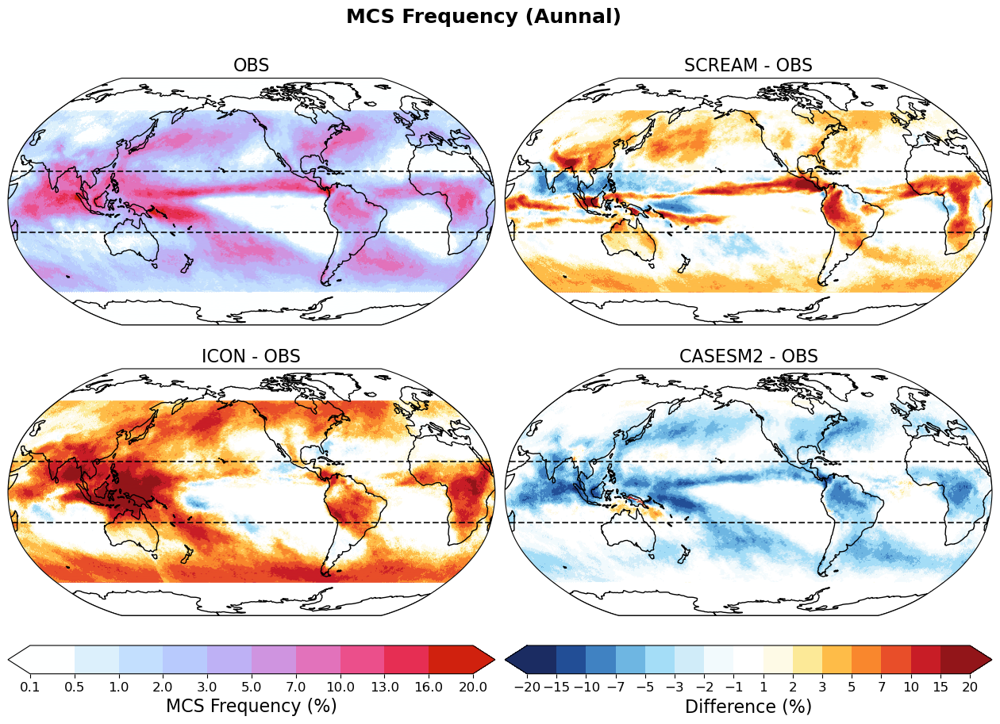

In [98]:
obs_data = mcsfreq_all.sel(source='obs')
model_data_list = [
    mcsfreq_all.sel(source='m1'),
    mcsfreq_all.sel(source='m2'),
    mcsfreq_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
obs_levels = [0.1,0.5,1,2,3,5,7,10,13,16,20]
obs_colormap = cmaps.cet_l_wcmr
obs_cbticks = obs_levels
obs_cblabel = 'MCS Frequency (%)'

# Difference data parameters
diff_levels = [-20,-15,-10,-7,-5,-3,-2,-1,1,2,3,5,7,10,15,20]
diff_colormap = cmaps.BlueWhiteOrangeRed
diff_cbticks = diff_levels
diff_cblabel = 'Difference (%)'

figname = f'{figdir}globalmap_mcs_freq_obs_vs_models_diff.png'
figtitle = 'MCS Frequency (Aunnal)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tropics_lat)

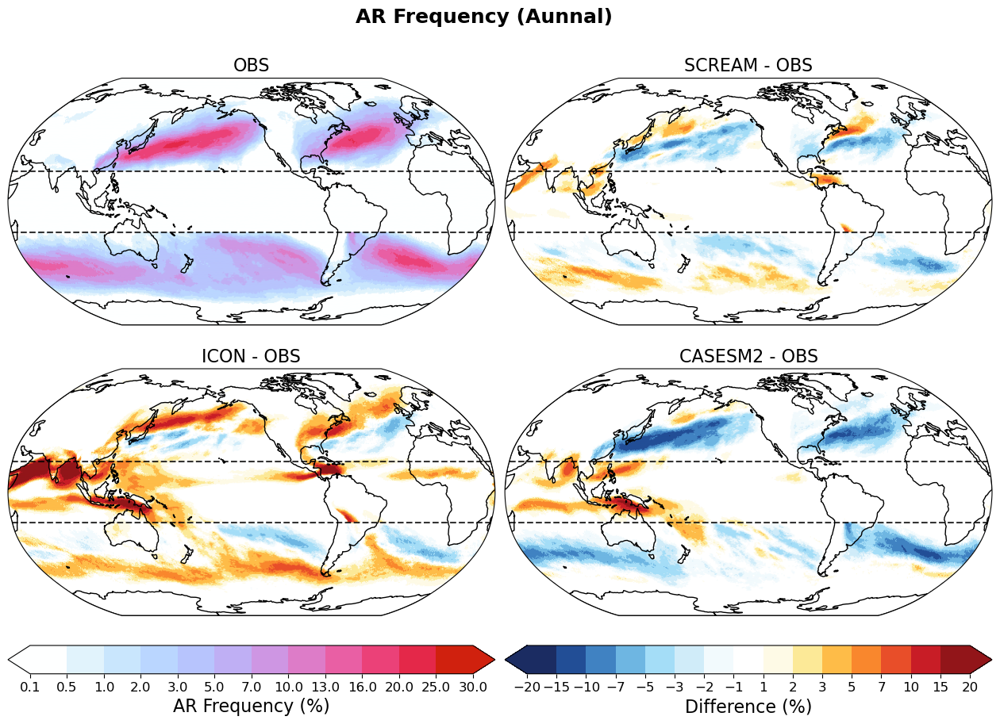

In [99]:
obs_data = arfreq_all.sel(source='obs')
model_data_list = [
    arfreq_all.sel(source='m1'),
    arfreq_all.sel(source='m2'),
    arfreq_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
obs_levels = [0.1,0.5,1,2,3,5,7,10,13,16,20,25,30]
obs_colormap = cmaps.cet_l_wcmr
obs_cbticks = obs_levels
obs_cblabel = 'AR Frequency (%)'

# Difference data parameters
diff_levels = [-20,-15,-10,-7,-5,-3,-2,-1,1,2,3,5,7,10,15,20]
diff_colormap = cmaps.BlueWhiteOrangeRed
diff_cbticks = diff_levels
diff_cblabel = 'Difference (%)'

figname = f'{figdir}globalmap_ar_freq_obs_vs_models_diff.png'
figtitle = 'AR Frequency (Aunnal)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tropics_lat)

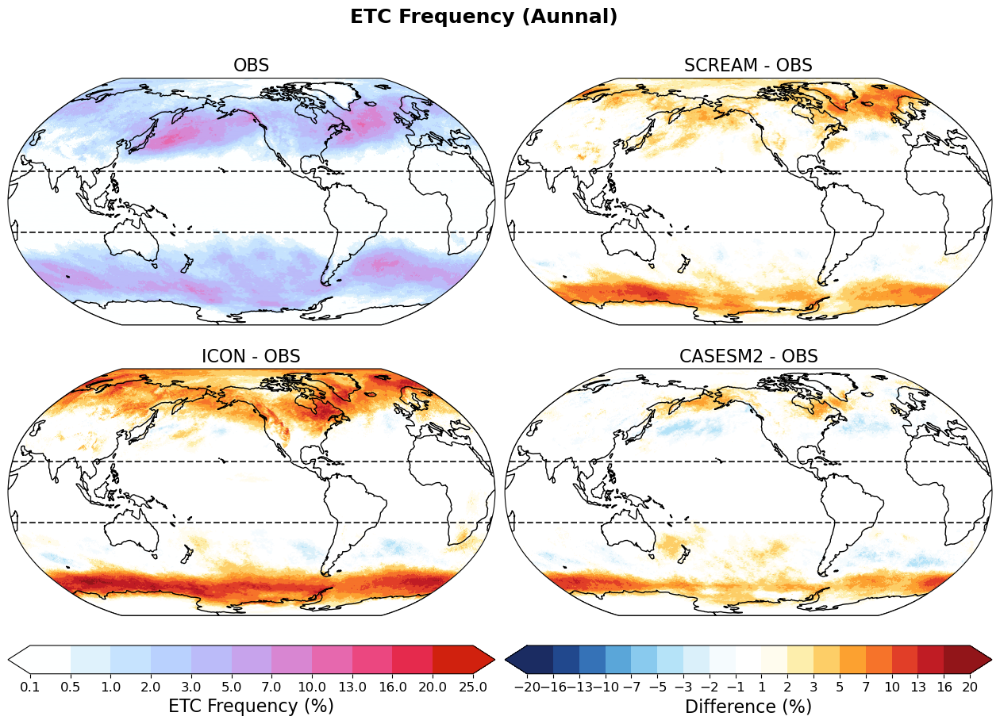

In [112]:
obs_data = etcfreq_all.sel(source='obs')
model_data_list = [
    etcfreq_all.sel(source='m1'),
    etcfreq_all.sel(source='m2'),
    etcfreq_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
obs_levels = [0.1,0.5,1,2,3,5,7,10,13,16,20,25]
obs_colormap = cmaps.cet_l_wcmr
obs_cbticks = obs_levels
obs_cblabel = 'ETC Frequency (%)'

# Difference data parameters
diff_levels = [-20,-16,-13,-10,-7,-5,-3,-2,-1,1,2,3,5,7,10,13,16,20]
diff_colormap = cmaps.BlueWhiteOrangeRed
diff_cbticks = diff_levels
diff_cblabel = 'Difference (%)'

figname = f'{figdir}globalmap_etc_freq_obs_vs_models_diff.png'
figtitle = 'ETC Frequency (Aunnal)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tropics_lat)



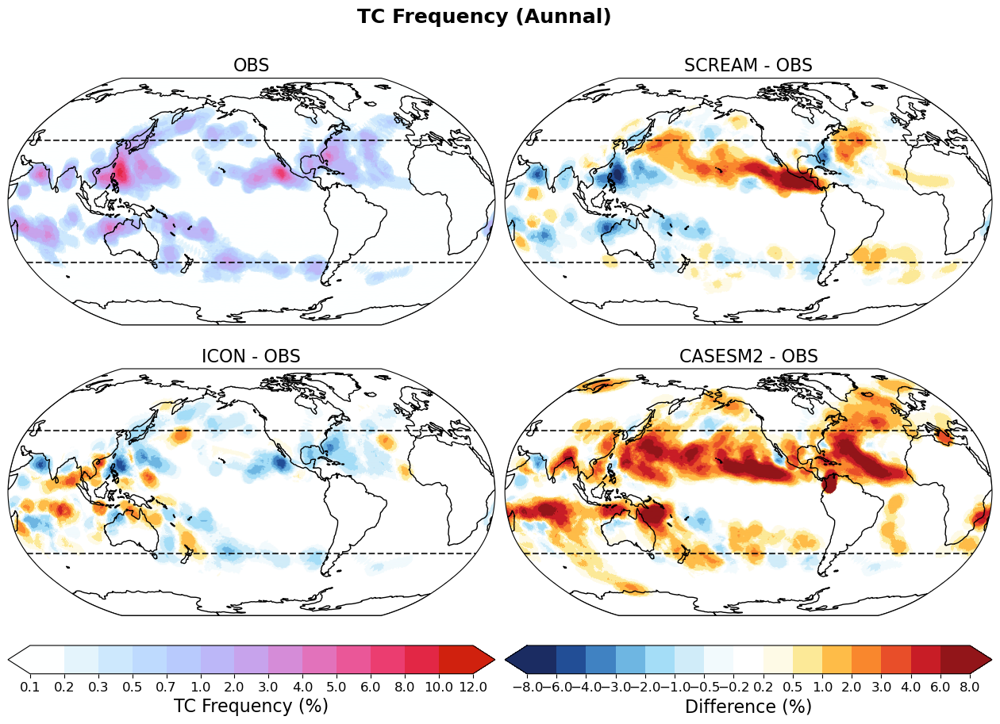

In [101]:
obs_data = tcfreq_all.sel(source='obs')
model_data_list = [
    tcfreq_all.sel(source='m1'),
    tcfreq_all.sel(source='m2'),
    tcfreq_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
obs_levels = [0.1,0.2,0.3,0.5,0.7,1,2,3,4,5,6,8,10,12]
obs_colormap = cmaps.cet_l_wcmr
obs_cbticks = obs_levels
obs_cblabel = 'TC Frequency (%)'

# Difference data parameters
diff_levels = [-8,-6,-4,-3,-2,-1,-0.5,-0.2,0.2,0.5,1,2,3,4,6,8]
diff_colormap = cmaps.BlueWhiteOrangeRed
diff_cbticks = diff_levels
diff_cblabel = 'Difference (%)'

figname = f'{figdir}globalmap_tc_freq_obs_vs_models_diff.png'
figtitle = 'TC Frequency (Aunnal)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tc_lat)



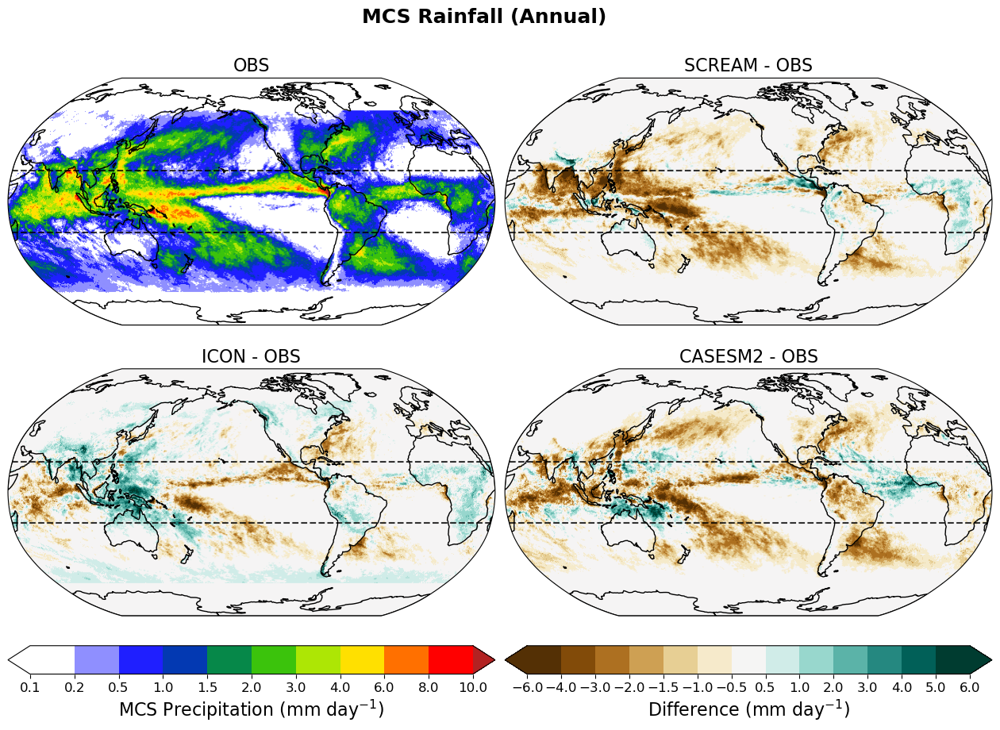

In [102]:
obs_data = mcspcp_all.sel(source='obs')
model_data_list = [
    mcspcp_all.sel(source='m1'),
    mcspcp_all.sel(source='m2'),
    mcspcp_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
obs_levels = [0.1,0.2,0.5,1,1.5,2,3,4,6,8,10]
obs_colormap = cmaps.WhBlGrYeRe
obs_cbticks = obs_levels
obs_oob_colors = {'over':'firebrick', 'under':'white'}
obs_cblabel = 'MCS Precipitation (mm day$^{-1}$)'

# Difference data parameters
diff_levels = [-6,-4,-3,-2,-1.5,-1,-0.5,0.5,1,2,3,4,5,6]
diff_colormap = 'BrBG'
diff_oob_colors = None
diff_cbticks = diff_levels
diff_cblabel = 'Difference (mm day$^{-1}$)'

figname = f'{figdir}globalmap_mcs_rain_obs_vs_models_diff.png'
figtitle = 'MCS Rainfall (Annual)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             obs_oob_colors=obs_oob_colors, diff_oob_colors=diff_oob_colors,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tropics_lat)

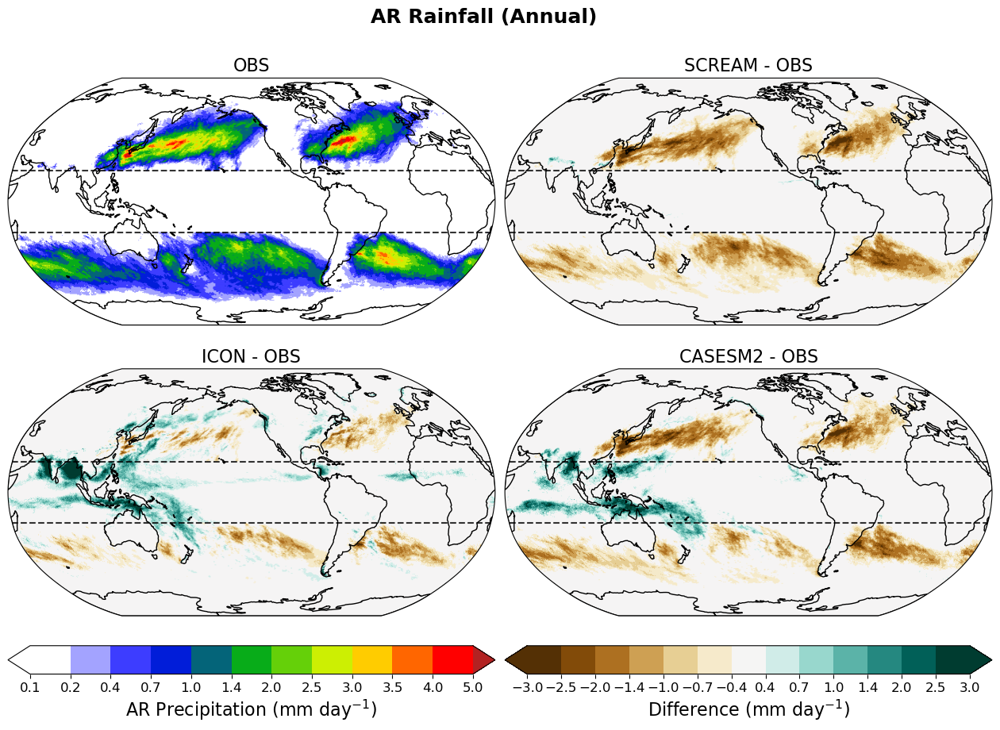

In [104]:
obs_data = arpcp_all.sel(source='obs')
model_data_list = [
    arpcp_all.sel(source='m1'),
    arpcp_all.sel(source='m2'),
    arpcp_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
obs_levels = [0.1,0.2,0.4,0.7,1.0,1.4,2,2.5,3,3.5,4,5]
obs_colormap = cmaps.WhBlGrYeRe
obs_cbticks = obs_levels
obs_oob_colors = {'over':'firebrick', 'under':'white'}
obs_cblabel = 'AR Precipitation (mm day$^{-1}$)'

# Difference data parameters
diff_levels = [-3,-2.5,-2,-1.4,-1.0,-0.7,-0.4,0.4,0.7,1.0,1.4,2,2.5,3]
diff_colormap = 'BrBG'
diff_oob_colors = None
diff_cbticks = diff_levels
diff_cblabel = 'Difference (mm day$^{-1}$)'

figname = f'{figdir}globalmap_ar_rain_obs_vs_models_diff.png'
figtitle = 'AR Rainfall (Annual)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             obs_oob_colors=obs_oob_colors, diff_oob_colors=diff_oob_colors,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tropics_lat)

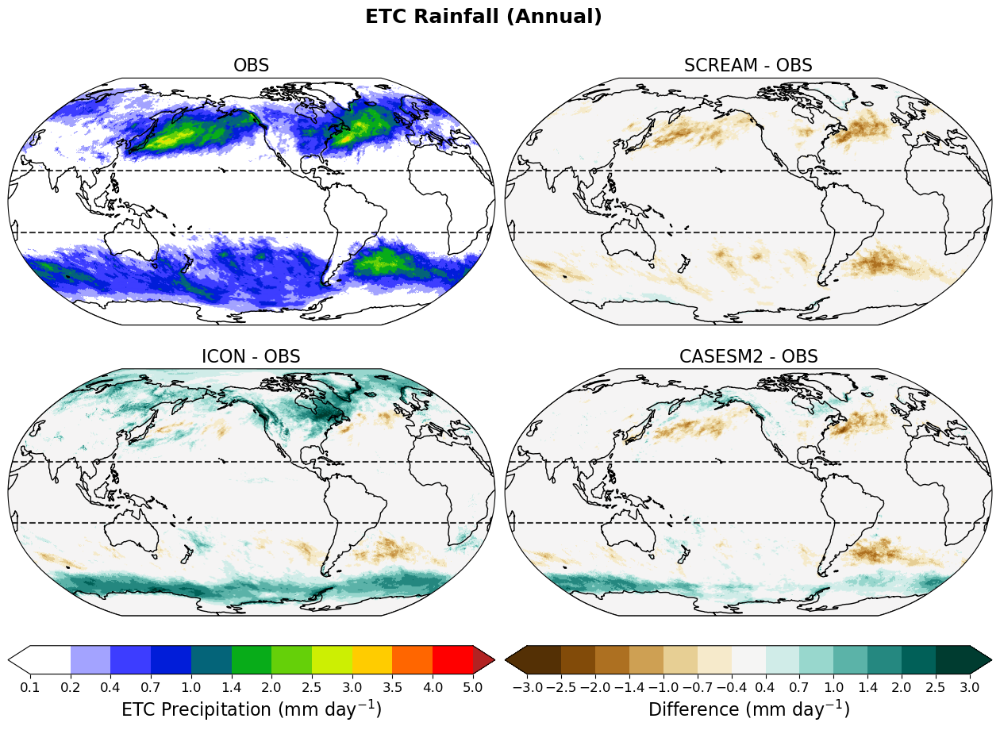

In [105]:
obs_data = etcpcp_all.sel(source='obs')
model_data_list = [
    etcpcp_all.sel(source='m1'),
    etcpcp_all.sel(source='m2'),
    etcpcp_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
obs_levels = [0.1,0.2,0.4,0.7,1.0,1.4,2,2.5,3,3.5,4,5]
obs_colormap = cmaps.WhBlGrYeRe
obs_cbticks = obs_levels
obs_oob_colors = {'over':'firebrick', 'under':'white'}
obs_cblabel = 'ETC Precipitation (mm day$^{-1}$)'

# Difference data parameters
diff_levels = [-3,-2.5,-2,-1.4,-1.0,-0.7,-0.4,0.4,0.7,1.0,1.4,2,2.5,3]
diff_colormap = 'BrBG'
diff_oob_colors = None
diff_cbticks = diff_levels
diff_cblabel = 'Difference (mm day$^{-1}$)'

figname = f'{figdir}globalmap_etc_rain_obs_vs_models_diff.png'
figtitle = 'ETC Rainfall (Annual)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             obs_oob_colors=obs_oob_colors, diff_oob_colors=diff_oob_colors,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tropics_lat)

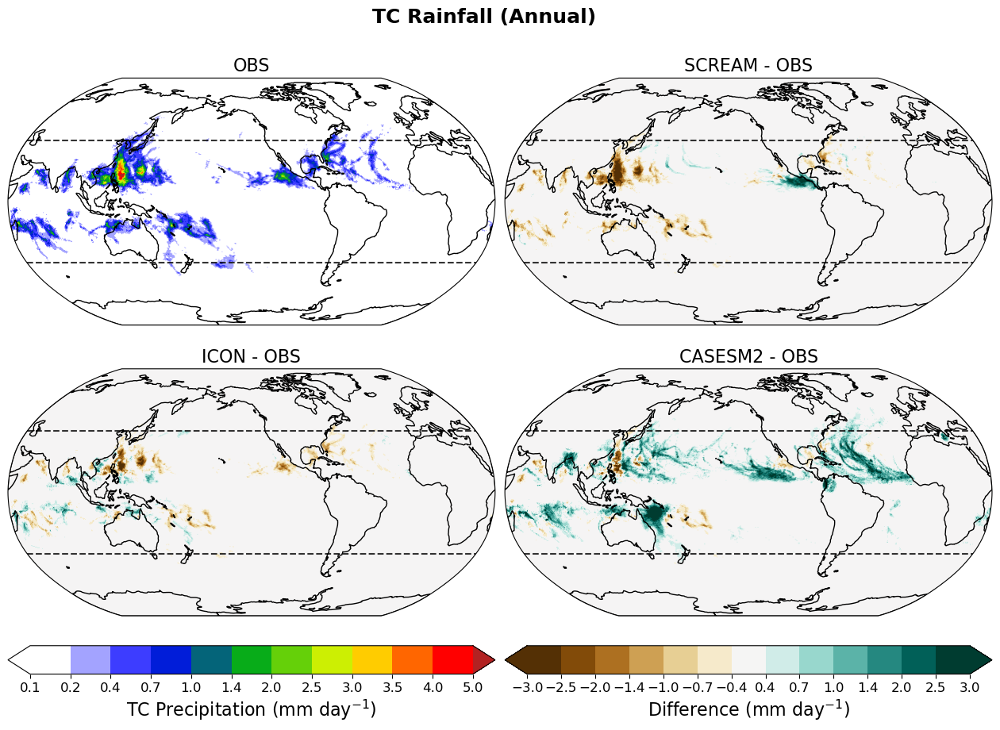

In [107]:
obs_data = tcpcp_all.sel(source='obs')
model_data_list = [
    tcpcp_all.sel(source='m1'),
    tcpcp_all.sel(source='m2'),
    tcpcp_all.sel(source='m3')
]

titles = [
    f"{name_map_plot['obs']}",
    f"{name_map_plot['m1']} - {name_map_plot['obs']}",
    f"{name_map_plot['m2']} - {name_map_plot['obs']}",
    f"{name_map_plot['m3']} - {name_map_plot['obs']}"
]

# Setup parameters
figwidth = 16
figheight = 10
figsize = [figwidth, figheight]
fontsize = 16
cb_fontsize = 12
wspace = 0.02
hspace = 0.05

# Observational data parameters
obs_levels = [0.1,0.2,0.4,0.7,1.0,1.4,2,2.5,3,3.5,4,5]
obs_colormap = cmaps.WhBlGrYeRe
obs_cbticks = obs_levels
obs_oob_colors = {'over':'firebrick', 'under':'white'}
obs_cblabel = 'TC Precipitation (mm day$^{-1}$)'

# Difference data parameters
diff_levels = [-3,-2.5,-2,-1.4,-1.0,-0.7,-0.4,0.4,0.7,1.0,1.4,2,2.5,3]
diff_colormap = 'BrBG'
diff_oob_colors = None
diff_cbticks = diff_levels
diff_cblabel = 'Difference (mm day$^{-1}$)'

figname = f'{figdir}globalmap_tc_rain_obs_vs_models_diff.png'
figtitle = 'TC Rainfall (Annual)'

# Plot figure
fig = plot_maps_obs_and_diffs(obs_data, model_data_list, titles,
                             obs_levels, diff_levels, obs_colormap, diff_colormap,
                             obs_cblabel, diff_cblabel, obs_cbticks, diff_cbticks, figname,
                             obs_oob_colors=obs_oob_colors, diff_oob_colors=diff_oob_colors,
                             min_thresh=None, wspace=wspace, hspace=hspace, figsize=figsize,
                             fontsize=fontsize, cb_fontsize=cb_fontsize, 
                             figtitle=figtitle, dpi=200, lat_lines=tc_lat)